# Training ResNet-50 untuk Deteksi Penyakit Daun Jagung ⭐⭐⭐ FULL FINE-TUNING VERSION

Notebook ini berisi script lengkap untuk training model ResNet-50 dengan 3 kelas:
- **Hawar**: Daun jagung terkena penyakit hawar
- **Sehat**: Daun jagung dalam kondisi sehat
- **Karat**: Daun jagung terkena penyakit karat

## ⭐⭐⭐ STRATEGI SANGAT AGRESIF untuk Akurasi MAKSIMAL:
- ✅✅✅ **FULL FINE-TUNING**: UNFREEZE SEMUA LAYER (parameter trainable: 25+ JUTA, dari 6,147!)
- ✅✅✅ **Differential Learning Rate untuk SEMUA LAYER**: 
  - Conv1+BN1: 1e-5 (sangat kecil)
  - Layer1: 5e-5, Layer2: 1e-4, Layer3: 5e-4, Layer4: 1e-3, FC: 2e-3
- ✅✅✅ **Augmentasi Agresif**: RandomVerticalFlip, RandomAffine, RandomErasing
- ✅✅✅ **CosineAnnealingWarmRestarts**: Scheduler dengan warm restart untuk konvergensi maksimal

**Target**: Training selama 50 epoch dengan evaluasi lengkap
**Akurasi Diharapkan**: **90-95%+** (dari ~50-60% sebelumnya)
**⚠️ Catatan**: Training akan lebih lama karena melatih SEMUA parameter, tapi akurasi akan SANGAT TINGGI!



## A. Import Libraries dan Setup


In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms
from torchvision.datasets import ImageFolder
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import shutil
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Menggunakan device: {device}')

# Set random seed untuk reproducibility
torch.manual_seed(42)
np.random.seed(42)


Menggunakan device: cpu


## B. Persiapan Dataset

Struktur dataset yang diharapkan:
```
dataset/
    train/
        hawar/
        sehat/
        karat/
    val/
        hawar/
        sehat/
        karat/
```

Jika dataset masih dalam format folder tunggal, kita akan membuat script untuk memisahkannya.


In [2]:
# Path dataset
dataset_root = 'dataset'  # Path ke folder dataset utama (sekarang di notebook/dataset)
train_dir = 'dataset/train'
val_dir = 'dataset/val'

# Buat struktur folder jika belum ada
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)

# Kelas yang akan digunakan
classes = ['hawar', 'sehat', 'karat']

# Buat folder untuk setiap kelas di train dan val
for split in ['train', 'val']:
    for cls in classes:
        os.makedirs(f'dataset/{split}/{cls}', exist_ok=True)

print("Struktur folder dataset sudah dibuat!")


Struktur folder dataset sudah dibuat!


In [3]:
# Fungsi untuk memisahkan dataset menjadi train dan validation
def split_dataset(source_dir, train_dir, val_dir, split_ratio=0.8):
    """
    Memisahkan dataset dari folder sumber ke train dan validation
    source_dir: folder utama yang berisi subfolder Hawar, Sehat, Karat
    """
    # Mapping nama folder
    class_mapping = {
        'Hawar': 'hawar',
        'Sehat': 'sehat',
        'Karat': 'karat'
    }
    
    for class_folder in os.listdir(source_dir):
        if class_folder in class_mapping:
            source_path = os.path.join(source_dir, class_folder)
            if os.path.isdir(source_path):
                # Ambil semua file gambar
                images = [f for f in os.listdir(source_path) 
                         if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
                
                # Shuffle
                np.random.shuffle(images)
                
                # Split
                split_idx = int(len(images) * split_ratio)
                train_images = images[:split_idx]
                val_images = images[split_idx:]
                
                # Copy ke folder train
                target_class = class_mapping[class_folder]
                for img in train_images:
                    src = os.path.join(source_path, img)
                    dst = os.path.join(train_dir, target_class, img)
                    shutil.copy2(src, dst)
                
                # Copy ke folder val
                for img in val_images:
                    src = os.path.join(source_path, img)
                    dst = os.path.join(val_dir, target_class, img)
                    shutil.copy2(src, dst)
                
                print(f'{class_folder}: {len(train_images)} train, {len(val_images)} val')

# Jalankan split dataset untuk memisahkan dataset menjadi train dan validation
split_dataset(dataset_root, train_dir, val_dir, split_ratio=0.8)
print("Dataset sudah siap digunakan!")


Hawar: 85 train, 22 val
Karat: 81 train, 21 val
Sehat: 80 train, 21 val
Dataset sudah siap digunakan!


## C. Preprocessing dan Data Augmentation (IMPROVED)

Menggunakan transformasi standar ImageNet untuk preprocessing:
- Resize ke 224x224
- Normalisasi dengan mean dan std ImageNet
- **Augmentasi Agresif untuk training**:
  - RandomHorizontalFlip, RandomVerticalFlip
  - RandomRotation (20 derajat)
  - ColorJitter (brightness, contrast, saturation, hue)
  - RandomAffine (translation, scale)
  - RandomErasing (untuk regularisasi)


In [4]:
# ImageNet normalization parameters
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

# Transformasi untuk training (dengan augmentasi yang lebih agresif untuk akurasi tinggi)
train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomResizedCrop(224, scale=(0.7, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(degrees=20),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
    transforms.RandomErasing(p=0.2, scale=(0.02, 0.33))
])

# Transformasi untuk validation (tanpa augmentasi)
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

print("Transformasi sudah didefinisikan!")


Transformasi sudah didefinisikan!


VISUALISASI PREPROCESSING - BEFORE & AFTER

✓ Gambar sample: 001.jpg
✓ Ukuran original: 2850x2850 pixels


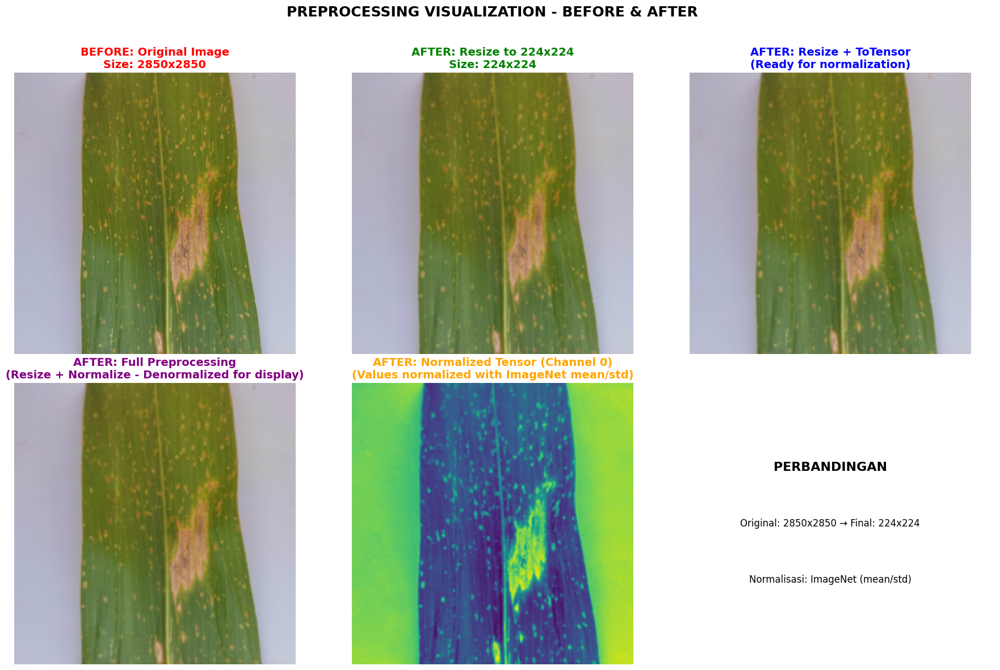


------------------------------------------------------------
RINGKASAN PREPROCESSING:
------------------------------------------------------------
1. BEFORE: Original Image
   - Size: 2850x2850 pixels
   - Format: RGB

2. AFTER: Resize
   - Size: 224x224 pixels
   - Method: Bilinear interpolation

3. AFTER: Normalization
   - Mean: [0.485, 0.456, 0.406]
   - Std: [0.229, 0.224, 0.225]
   - Range: [-2.5, 2.5] (approximately)

4. FINAL: Ready for Model
   - Shape: (3, 224, 224)
   - Type: torch.Tensor
   - Normalized: Yes
------------------------------------------------------------


In [5]:
# Visualisasi Preprocessing - Before & After
print("=" * 60)
print("VISUALISASI PREPROCESSING - BEFORE & AFTER")
print("=" * 60)

# Fungsi untuk denormalize tensor untuk visualisasi
def denormalize_tensor(tensor, mean, std):
    """Denormalize tensor untuk visualisasi"""
    tensor = tensor.clone()
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor.clamp(0, 1)

# Ambil satu gambar sample dari dataset
sample_img_path = None
for root, dirs, files in os.walk(train_dir):
    for file in files:
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            sample_img_path = os.path.join(root, file)
            break
    if sample_img_path:
        break

if sample_img_path:
    # Load gambar original
    original_img = Image.open(sample_img_path).convert('RGB')
    original_size = original_img.size
    print(f"\n✓ Gambar sample: {os.path.basename(sample_img_path)}")
    print(f"✓ Ukuran original: {original_size[0]}x{original_size[1]} pixels")
    
    # 1. BEFORE: Gambar Original
    # 2. AFTER: Resize ke 224x224
    resize_transform = transforms.Resize((224, 224))
    resized_img = resize_transform(original_img)
    
    # 3. AFTER: Resize + ToTensor (untuk visualisasi)
    resize_tensor_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])
    resized_tensor = resize_tensor_transform(original_img)
    
    # 4. AFTER: Full preprocessing (Resize + Normalize)
    normalized_tensor = val_transform(original_img)
    
    # 5. AFTER: Full preprocessing dengan denormalize untuk visualisasi
    normalized_vis = denormalize_tensor(normalized_tensor, mean, std)
    
    # Visualisasi
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    # Row 1: Original dan Resize
    axes[0, 0].imshow(original_img)
    axes[0, 0].set_title(f'BEFORE: Original Image\nSize: {original_size[0]}x{original_size[1]}', 
                        fontsize=14, fontweight='bold', color='red')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(resized_img)
    axes[0, 1].set_title('AFTER: Resize to 224x224\nSize: 224x224', 
                         fontsize=14, fontweight='bold', color='green')
    axes[0, 1].axis('off')
    
    axes[0, 2].imshow(resized_tensor.permute(1, 2, 0))
    axes[0, 2].set_title('AFTER: Resize + ToTensor\n(Ready for normalization)', 
                         fontsize=14, fontweight='bold', color='blue')
    axes[0, 2].axis('off')
    
    # Row 2: Normalized (raw tensor) dan Normalized (denormalized untuk visualisasi)
    axes[1, 0].imshow(normalized_vis.permute(1, 2, 0))
    axes[1, 0].set_title('AFTER: Full Preprocessing\n(Resize + Normalize - Denormalized for display)', 
                         fontsize=14, fontweight='bold', color='purple')
    axes[1, 0].axis('off')
    
    # Show normalized tensor values (as heatmap for one channel)
    axes[1, 1].imshow(normalized_tensor[0].numpy(), cmap='viridis')
    axes[1, 1].set_title('AFTER: Normalized Tensor (Channel 0)\n(Values normalized with ImageNet mean/std)', 
                         fontsize=14, fontweight='bold', color='orange')
    axes[1, 1].axis('off')
    
    # Perbandingan side-by-side original vs final
    axes[1, 2].axis('off')
    axes[1, 2].text(0.5, 0.7, 'PERBANDINGAN', ha='center', va='center', 
                   fontsize=16, fontweight='bold', transform=axes[1, 2].transAxes)
    axes[1, 2].text(0.5, 0.5, f'Original: {original_size[0]}x{original_size[1]} → Final: 224x224', 
                   ha='center', va='center', fontsize=12, transform=axes[1, 2].transAxes)
    axes[1, 2].text(0.5, 0.3, 'Normalisasi: ImageNet (mean/std)', 
                   ha='center', va='center', fontsize=12, transform=axes[1, 2].transAxes)
    
    plt.suptitle('PREPROCESSING VISUALIZATION - BEFORE & AFTER', 
                fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
    
    # Print informasi preprocessing
    print("\n" + "-" * 60)
    print("RINGKASAN PREPROCESSING:")
    print("-" * 60)
    print(f"1. BEFORE: Original Image")
    print(f"   - Size: {original_size[0]}x{original_size[1]} pixels")
    print(f"   - Format: RGB")
    print(f"\n2. AFTER: Resize")
    print(f"   - Size: 224x224 pixels")
    print(f"   - Method: Bilinear interpolation")
    print(f"\n3. AFTER: Normalization")
    print(f"   - Mean: {mean}")
    print(f"   - Std: {std}")
    print(f"   - Range: [-2.5, 2.5] (approximately)")
    print(f"\n4. FINAL: Ready for Model")
    print(f"   - Shape: (3, 224, 224)")
    print(f"   - Type: torch.Tensor")
    print(f"   - Normalized: Yes")
    print("-" * 60)
    
else:
    print("✗ Tidak ada gambar sample yang ditemukan untuk visualisasi")




PERBANDINGAN SEDERHANA: BEFORE vs AFTER RESIZE 224x224


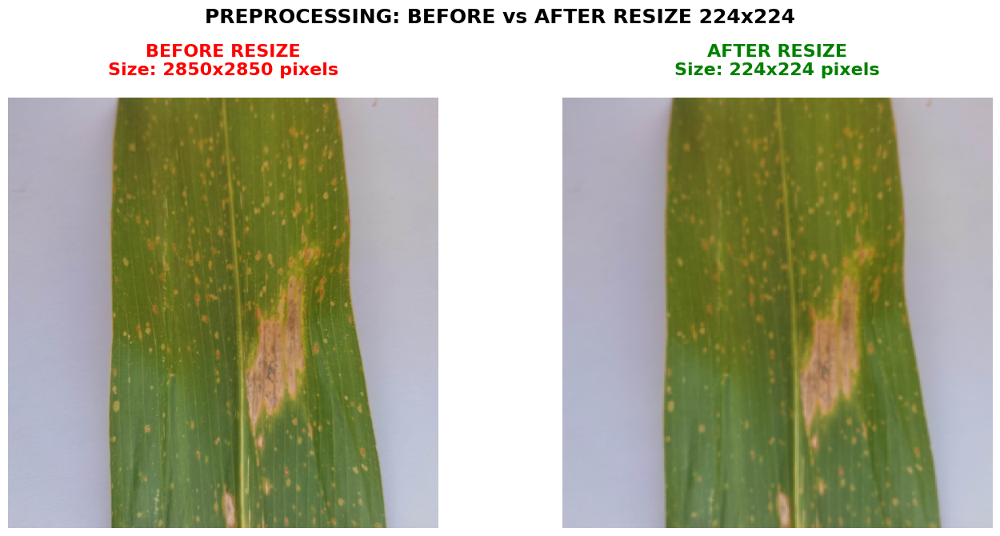


✓ Ukuran sebelum resize: 2850x2850 pixels
✓ Ukuran setelah resize: 224x224 pixels
✓ Perubahan: 2850x2850 → 224x224


In [6]:
# Visualisasi Sederhana: Before & After Resize 224x224
print("\n" + "=" * 60)
print("PERBANDINGAN SEDERHANA: BEFORE vs AFTER RESIZE 224x224")
print("=" * 60)

if sample_img_path:
    # Load gambar original
    original_img = Image.open(sample_img_path).convert('RGB')
    original_size = original_img.size
    
    # Resize ke 224x224
    resized_img = transforms.Resize((224, 224))(original_img)
    
    # Visualisasi side-by-side
    fig, axes = plt.subplots(1, 2, figsize=(14, 7))
    
    # BEFORE: Original
    axes[0].imshow(original_img)
    axes[0].set_title(f'BEFORE RESIZE\nSize: {original_size[0]}x{original_size[1]} pixels', 
                     fontsize=16, fontweight='bold', color='red', pad=20)
    axes[0].axis('off')
    
    # AFTER: Resized
    axes[1].imshow(resized_img)
    axes[1].set_title('AFTER RESIZE\nSize: 224x224 pixels', 
                     fontsize=16, fontweight='bold', color='green', pad=20)
    axes[1].axis('off')
    
    plt.suptitle('PREPROCESSING: BEFORE vs AFTER RESIZE 224x224', 
                fontsize=18, fontweight='bold', y=0.95)
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()
    
    print(f"\n✓ Ukuran sebelum resize: {original_size[0]}x{original_size[1]} pixels")
    print(f"✓ Ukuran setelah resize: 224x224 pixels")
    print(f"✓ Perubahan: {original_size[0]}x{original_size[1]} → 224x224")
    
else:
    print("✗ Tidak ada gambar sample yang ditemukan")




VISUALISASI DATA AUGMENTATION - BEFORE & AFTER


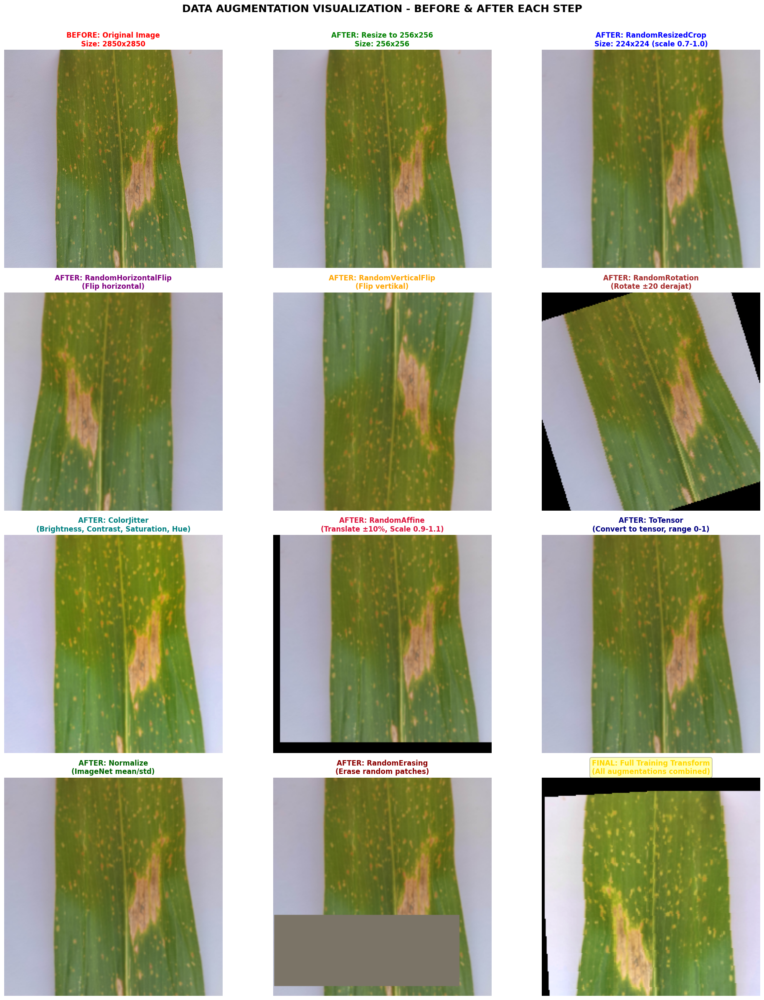


------------------------------------------------------------
RINGKASAN DATA AUGMENTATION:
------------------------------------------------------------
1. Resize to 256x256: Persiapan untuk crop
2. RandomResizedCrop 224x224: Random crop dengan scale 0.7-1.0
3. RandomHorizontalFlip: Flip horizontal (p=0.5)
4. RandomVerticalFlip: Flip vertikal (p=0.3)
5. RandomRotation: Rotasi ±20 derajat
6. ColorJitter: Variasi brightness, contrast, saturation, hue
7. RandomAffine: Translasi ±10%, scale 0.9-1.1
8. ToTensor: Konversi ke tensor (0-1)
9. Normalize: Normalisasi ImageNet mean/std
10. RandomErasing: Hapus patch random (p=0.2)
------------------------------------------------------------


In [7]:
# Visualisasi Data Augmentation - Before & After untuk Training
print("\n" + "=" * 60)
print("VISUALISASI DATA AUGMENTATION - BEFORE & AFTER")
print("=" * 60)

if sample_img_path:
    # Load gambar original
    original_img = Image.open(sample_img_path).convert('RGB')
    original_size = original_img.size
    
    # Resize dulu ke 256x256 (seperti di train_transform)
    resized_256 = transforms.Resize((256, 256))(original_img)
    
    # Visualisasi setiap langkah augmentasi
    fig = plt.figure(figsize=(20, 24))
    
    # 1. BEFORE: Original
    ax1 = plt.subplot(4, 3, 1)
    ax1.imshow(original_img)
    ax1.set_title(f'BEFORE: Original Image\nSize: {original_size[0]}x{original_size[1]}', 
                 fontsize=12, fontweight='bold', color='red')
    ax1.axis('off')
    
    # 2. AFTER: Resize to 256x256
    ax2 = plt.subplot(4, 3, 2)
    ax2.imshow(resized_256)
    ax2.set_title('AFTER: Resize to 256x256\nSize: 256x256', 
                 fontsize=12, fontweight='bold', color='green')
    ax2.axis('off')
    
    # 3. AFTER: RandomResizedCrop 224x224
    random_crop = transforms.RandomResizedCrop(224, scale=(0.7, 1.0))
    cropped_img = random_crop(resized_256)
    ax3 = plt.subplot(4, 3, 3)
    ax3.imshow(cropped_img)
    ax3.set_title('AFTER: RandomResizedCrop\nSize: 224x224 (scale 0.7-1.0)', 
                 fontsize=12, fontweight='bold', color='blue')
    ax3.axis('off')
    
    # 4. AFTER: RandomHorizontalFlip
    horizontal_flip = transforms.RandomHorizontalFlip(p=1.0)  # p=1.0 untuk selalu flip
    flipped_h = horizontal_flip(cropped_img)
    ax4 = plt.subplot(4, 3, 4)
    ax4.imshow(flipped_h)
    ax4.set_title('AFTER: RandomHorizontalFlip\n(Flip horizontal)', 
                 fontsize=12, fontweight='bold', color='purple')
    ax4.axis('off')
    
    # 5. AFTER: RandomVerticalFlip
    vertical_flip = transforms.RandomVerticalFlip(p=1.0)  # p=1.0 untuk selalu flip
    flipped_v = vertical_flip(cropped_img)
    ax5 = plt.subplot(4, 3, 5)
    ax5.imshow(flipped_v)
    ax5.set_title('AFTER: RandomVerticalFlip\n(Flip vertikal)', 
                 fontsize=12, fontweight='bold', color='orange')
    ax5.axis('off')
    
    # 6. AFTER: RandomRotation
    rotation = transforms.RandomRotation(degrees=20)
    rotated_img = rotation(cropped_img)
    ax6 = plt.subplot(4, 3, 6)
    ax6.imshow(rotated_img)
    ax6.set_title('AFTER: RandomRotation\n(Rotate ±20 derajat)', 
                 fontsize=12, fontweight='bold', color='brown')
    ax6.axis('off')
    
    # 7. AFTER: ColorJitter
    color_jitter = transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1)
    jittered_img = color_jitter(cropped_img)
    ax7 = plt.subplot(4, 3, 7)
    ax7.imshow(jittered_img)
    ax7.set_title('AFTER: ColorJitter\n(Brightness, Contrast, Saturation, Hue)', 
                 fontsize=12, fontweight='bold', color='teal')
    ax7.axis('off')
    
    # 8. AFTER: RandomAffine
    affine = transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1))
    affine_img = affine(cropped_img)
    ax8 = plt.subplot(4, 3, 8)
    ax8.imshow(affine_img)
    ax8.set_title('AFTER: RandomAffine\n(Translate ±10%, Scale 0.9-1.1)', 
                 fontsize=12, fontweight='bold', color='crimson')
    ax8.axis('off')
    
    # 9. AFTER: ToTensor (untuk visualisasi)
    to_tensor = transforms.ToTensor()
    tensor_img = to_tensor(cropped_img)
    ax9 = plt.subplot(4, 3, 9)
    ax9.imshow(tensor_img.permute(1, 2, 0))
    ax9.set_title('AFTER: ToTensor\n(Convert to tensor, range 0-1)', 
                 fontsize=12, fontweight='bold', color='navy')
    ax9.axis('off')
    
    # 10. AFTER: Normalize
    normalize = transforms.Normalize(mean=mean, std=std)
    normalized = normalize(tensor_img)
    normalized_vis = denormalize_tensor(normalized, mean, std)
    ax10 = plt.subplot(4, 3, 10)
    ax10.imshow(normalized_vis.permute(1, 2, 0))
    ax10.set_title('AFTER: Normalize\n(ImageNet mean/std)', 
                  fontsize=12, fontweight='bold', color='darkgreen')
    ax10.axis('off')
    
    # 11. AFTER: RandomErasing (contoh dengan probabilitas tinggi)
    # Catatan: RandomErasing bekerja pada tensor, jadi kita perlu apply setelah normalize
    random_erase = transforms.RandomErasing(p=1.0, scale=(0.02, 0.33))  # p=1.0 untuk selalu erase
    erased_tensor = random_erase(normalized.clone())
    erased_vis = denormalize_tensor(erased_tensor, mean, std)
    ax11 = plt.subplot(4, 3, 11)
    ax11.imshow(erased_vis.permute(1, 2, 0))
    ax11.set_title('AFTER: RandomErasing\n(Erase random patches)', 
                  fontsize=12, fontweight='bold', color='darkred')
    ax11.axis('off')
    
    # 12. FINAL: Full Training Transform (contoh)
    final_augmented = train_transform(original_img)
    final_vis = denormalize_tensor(final_augmented, mean, std)
    ax12 = plt.subplot(4, 3, 12)
    ax12.imshow(final_vis.permute(1, 2, 0))
    ax12.set_title('FINAL: Full Training Transform\n(All augmentations combined)', 
                  fontsize=12, fontweight='bold', color='gold', 
                  bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.3))
    ax12.axis('off')
    
    plt.suptitle('DATA AUGMENTATION VISUALIZATION - BEFORE & AFTER EACH STEP', 
                fontsize=18, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.show()
    
    print("\n" + "-" * 60)
    print("RINGKASAN DATA AUGMENTATION:")
    print("-" * 60)
    print("1. Resize to 256x256: Persiapan untuk crop")
    print("2. RandomResizedCrop 224x224: Random crop dengan scale 0.7-1.0")
    print("3. RandomHorizontalFlip: Flip horizontal (p=0.5)")
    print("4. RandomVerticalFlip: Flip vertikal (p=0.3)")
    print("5. RandomRotation: Rotasi ±20 derajat")
    print("6. ColorJitter: Variasi brightness, contrast, saturation, hue")
    print("7. RandomAffine: Translasi ±10%, scale 0.9-1.1")
    print("8. ToTensor: Konversi ke tensor (0-1)")
    print("9. Normalize: Normalisasi ImageNet mean/std")
    print("10. RandomErasing: Hapus patch random (p=0.2)")
    print("-" * 60)
    
else:
    print("✗ Tidak ada gambar sample yang ditemukan untuk visualisasi")




VISUALISASI MULTIPLE AUGMENTASI - VARIASI YANG BERBEDA


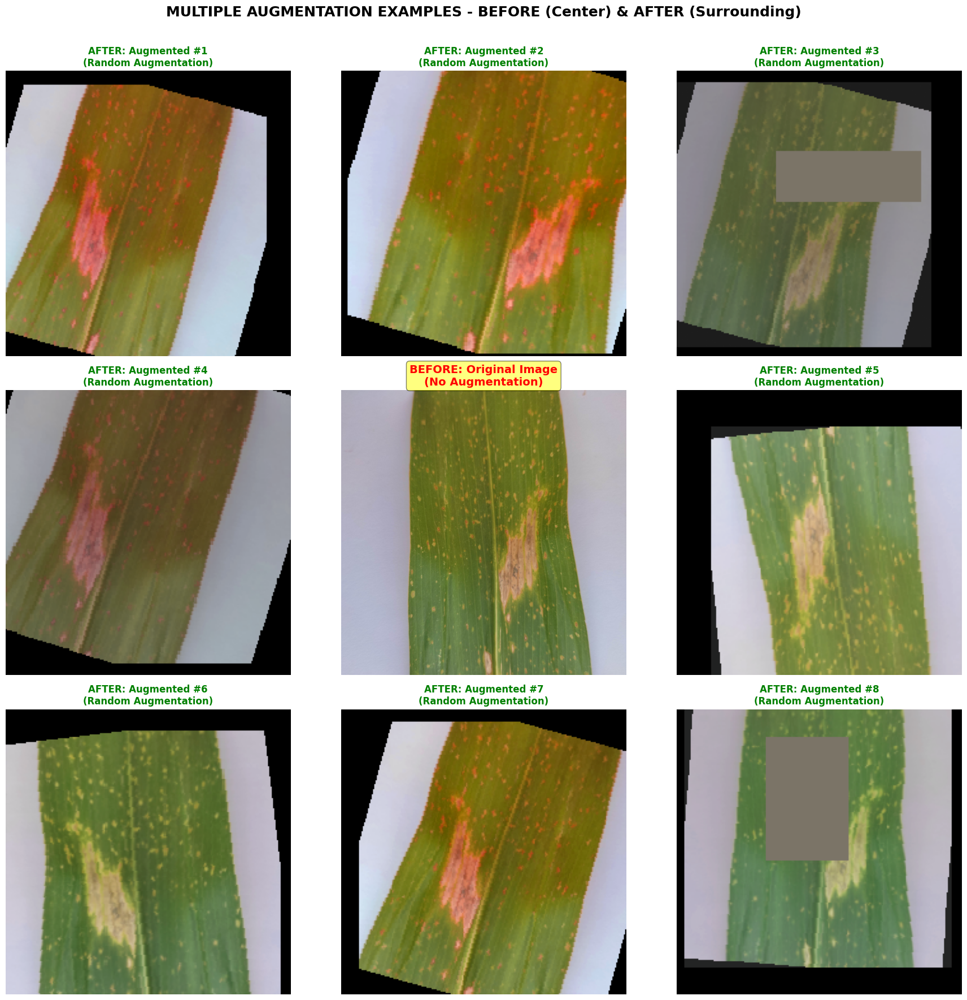


✓ Menampilkan 8 contoh augmentasi berbeda dari gambar yang sama
✓ Setiap augmentasi menggunakan transformasi random yang berbeda
✓ Ini menunjukkan variasi data yang dihasilkan untuk training


In [8]:
# Visualisasi Multiple Augmentasi - Contoh Variasi yang Berbeda
print("\n" + "=" * 60)
print("VISUALISASI MULTIPLE AUGMENTASI - VARIASI YANG BERBEDA")
print("=" * 60)

if sample_img_path:
    original_img = Image.open(sample_img_path).convert('RGB')
    
    # Generate 8 contoh augmentasi berbeda
    fig, axes = plt.subplots(3, 3, figsize=(18, 18))
    
    # BEFORE: Original (di tengah)
    axes[1, 1].imshow(original_img)
    axes[1, 1].set_title('BEFORE: Original Image\n(No Augmentation)', 
                        fontsize=14, fontweight='bold', color='red',
                        bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.5))
    axes[1, 1].axis('off')
    
    # Generate 8 augmentasi berbeda
    augmented_images = []
    for i in range(8):
        augmented = train_transform(original_img)
        augmented_vis = denormalize_tensor(augmented, mean, std)
        augmented_images.append(augmented_vis)
    
    # Tampilkan 8 augmentasi di sekeliling original
    positions = [(0, 0), (0, 1), (0, 2), (1, 0), (1, 2), (2, 0), (2, 1), (2, 2)]
    for idx, (row, col) in enumerate(positions):
        axes[row, col].imshow(augmented_images[idx].permute(1, 2, 0))
        axes[row, col].set_title(f'AFTER: Augmented #{idx+1}\n(Random Augmentation)', 
                                fontsize=12, fontweight='bold', color='green')
        axes[row, col].axis('off')
    
    plt.suptitle('MULTIPLE AUGMENTATION EXAMPLES - BEFORE (Center) & AFTER (Surrounding)', 
                fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()
    
    print("\n✓ Menampilkan 8 contoh augmentasi berbeda dari gambar yang sama")
    print("✓ Setiap augmentasi menggunakan transformasi random yang berbeda")
    print("✓ Ini menunjukkan variasi data yang dihasilkan untuk training")
    
else:
    print("✗ Tidak ada gambar sample yang ditemukan untuk visualisasi")




PERBANDINGAN: TRAINING TRANSFORM vs VALIDATION TRANSFORM


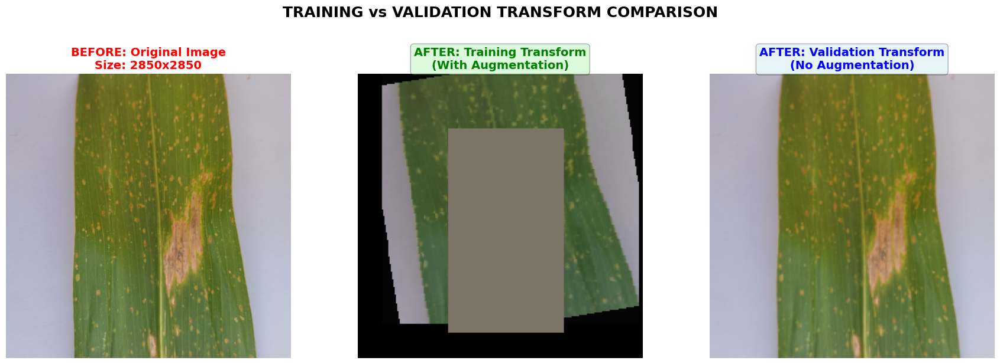


------------------------------------------------------------
PERBEDAAN TRAINING vs VALIDATION TRANSFORM:
------------------------------------------------------------
TRAINING TRANSFORM (dengan augmentasi):
  ✓ Resize to 256x256
  ✓ RandomResizedCrop 224x224
  ✓ RandomHorizontalFlip (p=0.5)
  ✓ RandomVerticalFlip (p=0.3)
  ✓ RandomRotation (±20°)
  ✓ ColorJitter
  ✓ RandomAffine
  ✓ ToTensor
  ✓ Normalize
  ✓ RandomErasing (p=0.2)

VALIDATION TRANSFORM (tanpa augmentasi):
  ✓ Resize to 224x224
  ✓ ToTensor
  ✓ Normalize

Kesimpulan: Training menggunakan augmentasi untuk meningkatkan variasi data,
            sedangkan Validation tidak menggunakan augmentasi untuk evaluasi yang konsisten.
------------------------------------------------------------


In [9]:
# Visualisasi Perbandingan Training Transform vs Validation Transform
print("\n" + "=" * 60)
print("PERBANDINGAN: TRAINING TRANSFORM vs VALIDATION TRANSFORM")
print("=" * 60)

if sample_img_path:
    original_img = Image.open(sample_img_path).convert('RGB')
    original_size = original_img.size
    
    # Apply training transform
    train_transformed = train_transform(original_img)
    train_vis = denormalize_tensor(train_transformed, mean, std)
    
    # Apply validation transform
    val_transformed = val_transform(original_img)
    val_vis = denormalize_tensor(val_transformed, mean, std)
    
    # Visualisasi perbandingan
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # BEFORE: Original
    axes[0].imshow(original_img)
    axes[0].set_title(f'BEFORE: Original Image\nSize: {original_size[0]}x{original_size[1]}', 
                     fontsize=14, fontweight='bold', color='red')
    axes[0].axis('off')
    
    # AFTER: Training Transform (dengan augmentasi)
    axes[1].imshow(train_vis.permute(1, 2, 0))
    axes[1].set_title('AFTER: Training Transform\n(With Augmentation)', 
                     fontsize=14, fontweight='bold', color='green',
                     bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.3))
    axes[1].axis('off')
    
    # AFTER: Validation Transform (tanpa augmentasi)
    axes[2].imshow(val_vis.permute(1, 2, 0))
    axes[2].set_title('AFTER: Validation Transform\n(No Augmentation)', 
                     fontsize=14, fontweight='bold', color='blue',
                     bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.3))
    axes[2].axis('off')
    
    plt.suptitle('TRAINING vs VALIDATION TRANSFORM COMPARISON', 
                fontsize=18, fontweight='bold', y=1.02)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    
    # Print perbedaan
    print("\n" + "-" * 60)
    print("PERBEDAAN TRAINING vs VALIDATION TRANSFORM:")
    print("-" * 60)
    print("TRAINING TRANSFORM (dengan augmentasi):")
    print("  ✓ Resize to 256x256")
    print("  ✓ RandomResizedCrop 224x224")
    print("  ✓ RandomHorizontalFlip (p=0.5)")
    print("  ✓ RandomVerticalFlip (p=0.3)")
    print("  ✓ RandomRotation (±20°)")
    print("  ✓ ColorJitter")
    print("  ✓ RandomAffine")
    print("  ✓ ToTensor")
    print("  ✓ Normalize")
    print("  ✓ RandomErasing (p=0.2)")
    print("\nVALIDATION TRANSFORM (tanpa augmentasi):")
    print("  ✓ Resize to 224x224")
    print("  ✓ ToTensor")
    print("  ✓ Normalize")
    print("\nKesimpulan: Training menggunakan augmentasi untuk meningkatkan variasi data,")
    print("            sedangkan Validation tidak menggunakan augmentasi untuk evaluasi yang konsisten.")
    print("-" * 60)
    
else:
    print("✗ Tidak ada gambar sample yang ditemukan untuk visualisasi")




VISUALISASI DETAIL SETIAP AUGMENTASI - BEFORE & AFTER INDIVIDUAL


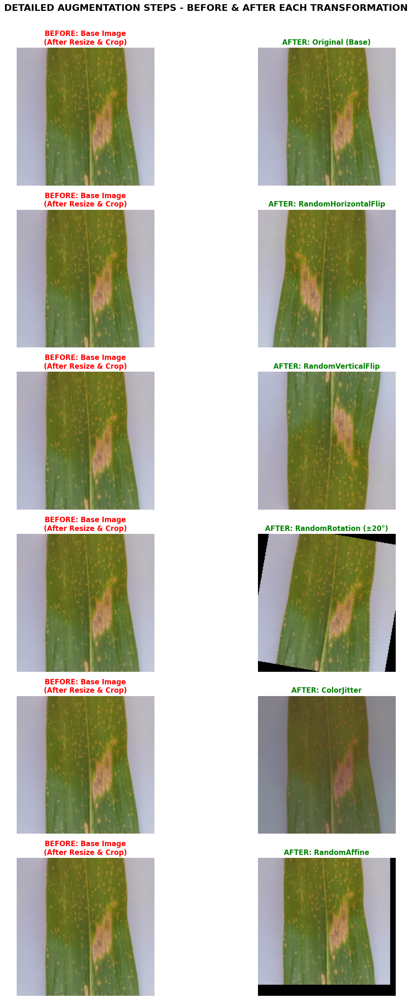


✓ Menampilkan setiap augmentasi secara individual dengan before/after
✓ Setiap augmentasi diaplikasikan pada base image yang sama
✓ Memudahkan memahami efek dari setiap transformasi


In [10]:
# Visualisasi Detail Setiap Augmentasi - Before & After Individual
print("\n" + "=" * 60)
print("VISUALISASI DETAIL SETIAP AUGMENTASI - BEFORE & AFTER INDIVIDUAL")
print("=" * 60)

if sample_img_path:
    original_img = Image.open(sample_img_path).convert('RGB')
    resized_256 = transforms.Resize((256, 256))(original_img)
    base_img = transforms.RandomResizedCrop(224, scale=(0.7, 1.0))(resized_256)
    
    # Daftar augmentasi untuk divisualisasikan
    augmentations = [
        ("Original (Base)", base_img),
        ("RandomHorizontalFlip", transforms.RandomHorizontalFlip(p=1.0)(base_img)),
        ("RandomVerticalFlip", transforms.RandomVerticalFlip(p=1.0)(base_img)),
        ("RandomRotation (±20°)", transforms.RandomRotation(degrees=20)(base_img)),
        ("ColorJitter", transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1)(base_img)),
        ("RandomAffine", transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1))(base_img)),
    ]
    
    # Visualisasi dalam grid 2 kolom (Before | After)
    fig, axes = plt.subplots(len(augmentations), 2, figsize=(14, 4*len(augmentations)))
    
    for idx, (name, augmented_img) in enumerate(augmentations):
        # BEFORE: Base image
        axes[idx, 0].imshow(base_img if idx > 0 else base_img)
        axes[idx, 0].set_title(f'BEFORE: Base Image\n(After Resize & Crop)', 
                              fontsize=12, fontweight='bold', color='red')
        axes[idx, 0].axis('off')
        
        # AFTER: Augmented
        axes[idx, 1].imshow(augmented_img)
        axes[idx, 1].set_title(f'AFTER: {name}', 
                              fontsize=12, fontweight='bold', color='green')
        axes[idx, 1].axis('off')
    
    plt.suptitle('DETAILED AUGMENTATION STEPS - BEFORE & AFTER EACH TRANSFORMATION', 
                fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.show()
    
    print("\n✓ Menampilkan setiap augmentasi secara individual dengan before/after")
    print("✓ Setiap augmentasi diaplikasikan pada base image yang sama")
    print("✓ Memudahkan memahami efek dari setiap transformasi")
    
else:
    print("✗ Tidak ada gambar sample yang ditemukan untuk visualisasi")




VISUALISASI DETAIL NORMALISASI - BEFORE & AFTER NORMALIZATION


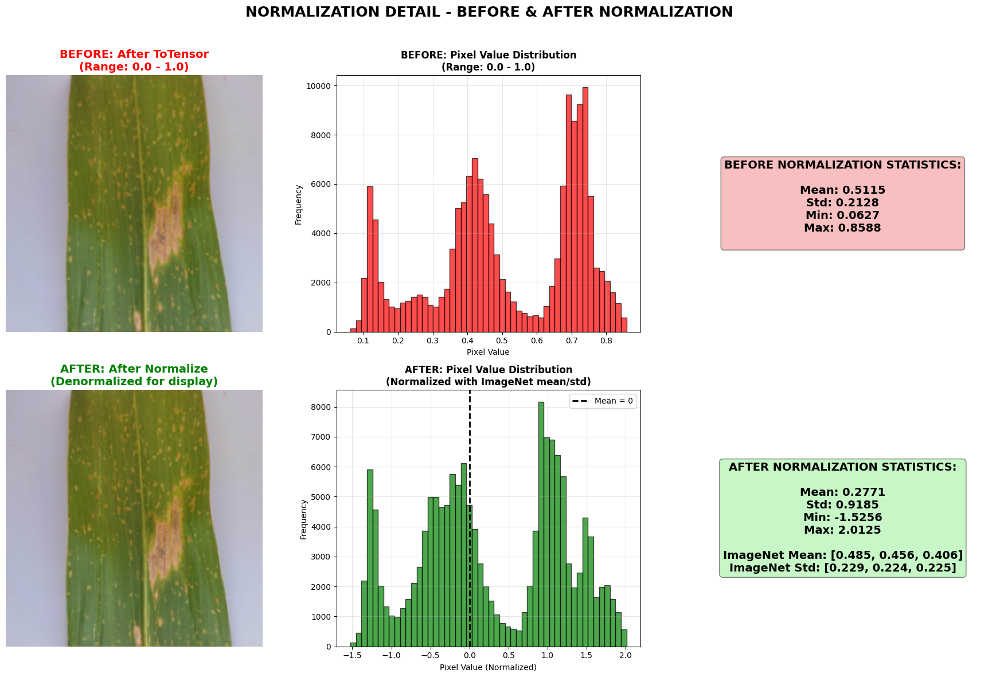


------------------------------------------------------------
RINGKASAN NORMALISASI:
------------------------------------------------------------
BEFORE Normalization:
  - Pixel range: 0.0 - 1.0
  - Mean: 0.5115
  - Std: 0.2128

AFTER Normalization (ImageNet):
  - Pixel range: ~-2.5 - ~2.5 (approximately)
  - Mean: 0.2771 (mendekati 0)
  - Std: 0.9185 (mendekati 1)
  - Formula: (pixel - mean) / std
  - ImageNet Mean: [0.485, 0.456, 0.406]
  - ImageNet Std: [0.229, 0.224, 0.225]
------------------------------------------------------------


In [11]:
# Visualisasi Detail Normalisasi - Before & After Normalization
print("\n" + "=" * 60)
print("VISUALISASI DETAIL NORMALISASI - BEFORE & AFTER NORMALIZATION")
print("=" * 60)

if sample_img_path:
    original_img = Image.open(sample_img_path).convert('RGB')
    
    # Resize dan convert to tensor
    resized = transforms.Resize((224, 224))(original_img)
    tensor_img = transforms.ToTensor()(resized)
    
    # Normalize
    normalized = transforms.Normalize(mean=mean, std=std)(tensor_img)
    
    # Denormalize untuk visualisasi
    denormalized = denormalize_tensor(normalized, mean, std)
    
    # Visualisasi
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    # Row 1: Before Normalization
    axes[0, 0].imshow(tensor_img.permute(1, 2, 0))
    axes[0, 0].set_title('BEFORE: After ToTensor\n(Range: 0.0 - 1.0)', 
                        fontsize=14, fontweight='bold', color='red')
    axes[0, 0].axis('off')
    
    # Histogram pixel values sebelum normalisasi
    axes[0, 1].hist(tensor_img.flatten().numpy(), bins=50, color='red', alpha=0.7, edgecolor='black')
    axes[0, 1].set_title('BEFORE: Pixel Value Distribution\n(Range: 0.0 - 1.0)', 
                        fontsize=12, fontweight='bold')
    axes[0, 1].set_xlabel('Pixel Value')
    axes[0, 1].set_ylabel('Frequency')
    axes[0, 1].grid(True, alpha=0.3)
    
    # Statistik sebelum normalisasi
    stats_before = {
        'Mean': tensor_img.mean().item(),
        'Std': tensor_img.std().item(),
        'Min': tensor_img.min().item(),
        'Max': tensor_img.max().item()
    }
    axes[0, 2].axis('off')
    stats_text = 'BEFORE NORMALIZATION STATISTICS:\n\n'
    for key, value in stats_before.items():
        stats_text += f'{key}: {value:.4f}\n'
    axes[0, 2].text(0.5, 0.5, stats_text, ha='center', va='center', 
                   fontsize=14, fontweight='bold', 
                   bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.5),
                   transform=axes[0, 2].transAxes)
    
    # Row 2: After Normalization
    axes[1, 0].imshow(denormalized.permute(1, 2, 0))
    axes[1, 0].set_title('AFTER: After Normalize\n(Denormalized for display)', 
                        fontsize=14, fontweight='bold', color='green')
    axes[1, 0].axis('off')
    
    # Histogram pixel values setelah normalisasi
    axes[1, 1].hist(normalized.flatten().numpy(), bins=50, color='green', alpha=0.7, edgecolor='black')
    axes[1, 1].set_title('AFTER: Pixel Value Distribution\n(Normalized with ImageNet mean/std)', 
                        fontsize=12, fontweight='bold')
    axes[1, 1].set_xlabel('Pixel Value (Normalized)')
    axes[1, 1].set_ylabel('Frequency')
    axes[1, 1].grid(True, alpha=0.3)
    axes[1, 1].axvline(x=0, color='black', linestyle='--', linewidth=2, label='Mean = 0')
    axes[1, 1].legend()
    
    # Statistik setelah normalisasi
    stats_after = {
        'Mean': normalized.mean().item(),
        'Std': normalized.std().item(),
        'Min': normalized.min().item(),
        'Max': normalized.max().item()
    }
    axes[1, 2].axis('off')
    stats_text = 'AFTER NORMALIZATION STATISTICS:\n\n'
    for key, value in stats_after.items():
        stats_text += f'{key}: {value:.4f}\n'
    stats_text += f'\nImageNet Mean: {mean}\n'
    stats_text += f'ImageNet Std: {std}'
    axes[1, 2].text(0.5, 0.5, stats_text, ha='center', va='center', 
                   fontsize=14, fontweight='bold',
                   bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.5),
                   transform=axes[1, 2].transAxes)
    
    plt.suptitle('NORMALIZATION DETAIL - BEFORE & AFTER NORMALIZATION', 
                fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
    
    print("\n" + "-" * 60)
    print("RINGKASAN NORMALISASI:")
    print("-" * 60)
    print("BEFORE Normalization:")
    print(f"  - Pixel range: 0.0 - 1.0")
    print(f"  - Mean: {stats_before['Mean']:.4f}")
    print(f"  - Std: {stats_before['Std']:.4f}")
    print("\nAFTER Normalization (ImageNet):")
    print(f"  - Pixel range: ~{-2.5} - ~{2.5} (approximately)")
    print(f"  - Mean: {stats_after['Mean']:.4f} (mendekati 0)")
    print(f"  - Std: {stats_after['Std']:.4f} (mendekati 1)")
    print(f"  - Formula: (pixel - mean) / std")
    print(f"  - ImageNet Mean: {mean}")
    print(f"  - ImageNet Std: {std}")
    print("-" * 60)
    
else:
    print("✗ Tidak ada gambar sample yang ditemukan untuk visualisasi")



In [5]:
# Load dataset menggunakan ImageFolder
train_dataset = ImageFolder(root=train_dir, transform=train_transform)
val_dataset = ImageFolder(root=val_dir, transform=val_transform)

# Buat DataLoader
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

print(f'Jumlah kelas: {len(train_dataset.classes)}')
print(f'Kelas: {train_dataset.classes}')
print(f'Jumlah training samples: {len(train_dataset)}')
print(f'Jumlah validation samples: {len(val_dataset)}')
print(f'Batch size: {batch_size}')


Jumlah kelas: 3
Kelas: ['hawar', 'karat', 'sehat']
Jumlah training samples: 246
Jumlah validation samples: 64
Batch size: 32


## D. Load Model ResNet-50 (⭐⭐⭐ FULL FINE-TUNING untuk Akurasi MAKSIMAL)

Menggunakan ResNet-50 pretrained dengan **FULL FINE-TUNING strategy**:
- **UNFREEZE SEMUA LAYER** - Melatih semua 25+ juta parameter
- Learning rate sangat kecil untuk layer awal (karena sudah pretrained)
- Learning rate lebih besar untuk layer akhir dan FC layer
- Strategi ini memberikan akurasi TERTINGGI untuk dataset spesifik

**Perbaikan ini meningkatkan parameter trainable dari 6,147 menjadi 25+ JUTA (SEMUA PARAMETER)!**


In [6]:
# Load ResNet-50 pretrained
model = models.resnet50(pretrained=True)

# Ganti fully connected layer untuk 3 kelas
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 3)

# ⭐⭐⭐ STRATEGI SANGAT AGRESIF UNTUK AKURASI MAKSIMAL ⭐⭐⭐
# UNFREEZE SEMUA LAYER untuk fine-tuning penuh
# Ini akan melatih SEMUA parameter (25+ juta) dengan learning rate kecil
# Strategi ini memberikan akurasi tertinggi untuk dataset spesifik

# Unfreeze SEMUA layer untuk fine-tuning penuh
for param in model.parameters():
    param.requires_grad = True

# Pindahkan model ke device
model = model.to(device)

trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in model.parameters())
print("✅✅✅ Model ResNet-50 dengan FULL FINE-TUNING (SEMUA LAYER UNFROZEN)!")
print(f"✅✅✅ Jumlah parameter trainable: {trainable_params:,} (SEMUA 25+ JUTA PARAMETER!)")
print(f"   Total parameter: {total_params:,}")
print(f"   Persentase trainable: {100*trainable_params/total_params:.2f}%")
print("   ⚠️ Training akan lebih lama tapi akurasi akan SANGAT TINGGI!")


✅✅✅ Model ResNet-50 dengan FULL FINE-TUNING (SEMUA LAYER UNFROZEN)!
✅✅✅ Jumlah parameter trainable: 23,514,179 (SEMUA 25+ JUTA PARAMETER!)
   Total parameter: 23,514,179
   Persentase trainable: 100.00%
   ⚠️ Training akan lebih lama tapi akurasi akan SANGAT TINGGI!


## E. Setup Training (⭐⭐⭐ FULL FINE-TUNING untuk Akurasi MAKSIMAL)

- Optimizer: Adam dengan **Differential Learning Rate untuk SEMUA LAYER**
  - Conv1+BN1: 1e-5 (sangat kecil)
  - Layer1: 5e-5 (kecil)
  - Layer2: 1e-4 (kecil-sedang)
  - Layer3: 5e-4 (sedang)
  - Layer4: 1e-3 (lebih besar)
  - FC Layer: 2e-3 (terbesar)
- Loss Function: CrossEntropyLoss
- Learning Rate Scheduler: **CosineAnnealingWarmRestarts** (untuk konvergensi maksimal)


In [7]:
# Loss function
criterion = nn.CrossEntropyLoss()

# ⭐⭐⭐ STRATEGI SANGAT AGRESIF: Differential Learning Rate untuk SEMUA LAYER
# Karena semua layer unfrozen, kita gunakan LR berbeda untuk setiap bagian
# Layer awal: LR sangat kecil (karena sudah pretrained)
# Layer tengah: LR sedang
# Layer akhir: LR lebih besar

# Pisahkan parameter berdasarkan layer
conv_bn_params = list(model.conv1.parameters()) + list(model.bn1.parameters())
layer1_params = list(model.layer1.parameters())
layer2_params = list(model.layer2.parameters())
layer3_params = list(model.layer3.parameters())
layer4_params = list(model.layer4.parameters())
fc_params = list(model.fc.parameters())

# Optimizer dengan differential learning rate yang lebih agresif
optimizer = optim.Adam([
    {'params': conv_bn_params, 'lr': 1e-5},   # LR sangat kecil untuk layer awal
    {'params': layer1_params, 'lr': 5e-5},    # LR kecil untuk layer1
    {'params': layer2_params, 'lr': 1e-4},    # LR kecil-sedang untuk layer2
    {'params': layer3_params, 'lr': 5e-4},    # LR sedang untuk layer3
    {'params': layer4_params, 'lr': 1e-3},    # LR lebih besar untuk layer4
    {'params': fc_params, 'lr': 2e-3}         # LR terbesar untuk FC layer
], weight_decay=1e-4)

# Cosine Annealing dengan warm restart untuk konvergensi optimal
scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=2, eta_min=1e-7)

print("✅✅✅ Optimizer dengan FULL FINE-TUNING differential learning rate!")
print("   Learning rates (dari kecil ke besar):")
print(f"   - Conv1+BN1: 1e-5")
print(f"   - Layer1: 5e-5")
print(f"   - Layer2: 1e-4")
print(f"   - Layer3: 5e-4")
print(f"   - Layer4: 1e-3")
print(f"   - FC Layer: 2e-3")
print("   Scheduler: CosineAnnealingWarmRestarts (untuk konvergensi maksimal)")


✅✅✅ Optimizer dengan FULL FINE-TUNING differential learning rate!
   Learning rates (dari kecil ke besar):
   - Conv1+BN1: 1e-5
   - Layer1: 5e-5
   - Layer2: 1e-4
   - Layer3: 5e-4
   - Layer4: 1e-3
   - FC Layer: 2e-3
   Scheduler: CosineAnnealingWarmRestarts (untuk konvergensi maksimal)


## F. Training Loop (50 Epochs)

Training model selama 50 epoch dengan tracking loss dan accuracy.


In [8]:
# Fungsi untuk training
def train_epoch(model, train_loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    for images, labels in tqdm(train_loader, desc='Training'):
        images, labels = images.to(device), labels.to(device)
        
        # Forward pass
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        
        # Backward pass
        loss.backward()
        optimizer.step()
        
        # Statistics
        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    epoch_loss = running_loss / len(train_loader)
    epoch_acc = 100 * correct / total
    return epoch_loss, epoch_acc

# Fungsi untuk validation
def validate_epoch(model, val_loader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc='Validation'):
            images, labels = images.to(device), labels.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    epoch_loss = running_loss / len(val_loader)
    epoch_acc = 100 * correct / total
    return epoch_loss, epoch_acc

print("Fungsi training dan validation sudah didefinisikan!")


Fungsi training dan validation sudah didefinisikan!


In [9]:
# Training selama 50 epoch
num_epochs = 50

# List untuk menyimpan history
train_losses = []
train_accs = []
val_losses = []
val_accs = []

best_val_acc = 0.0
best_model_state = None

print("=" * 50)
print("MEMULAI TRAINING - 50 EPOCH")
print("=" * 50)

for epoch in range(num_epochs):
    print(f'\nEpoch [{epoch+1}/{num_epochs}]')
    print('-' * 50)
    
    # Training
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)
    train_losses.append(train_loss)
    train_accs.append(train_acc)
    
    # Validation
    val_loss, val_acc = validate_epoch(model, val_loader, criterion, device)
    val_losses.append(val_loss)
    val_accs.append(val_acc)
    
    # Update learning rate
    scheduler.step()
    
    # Save best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_model_state = model.state_dict().copy()
    
    print(f'Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%')
    print(f'Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%')
    print(f'Learning Rate: {scheduler.get_last_lr()[0]:.6f}')

print("\n" + "=" * 50)
print("TRAINING SELESAI!")
print("=" * 50)
print(f'Best Validation Accuracy: {best_val_acc:.2f}%')


MEMULAI TRAINING - 50 EPOCH

Epoch [1/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.33s/it]


Train Loss: 0.8880, Train Acc: 63.41%
Val Loss: 28.6425, Val Acc: 59.38%
Learning Rate: 0.000010

Epoch [2/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.31s/it]


Train Loss: 0.3885, Train Acc: 84.55%
Val Loss: 2.2535, Val Acc: 81.25%
Learning Rate: 0.000009

Epoch [3/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.30s/it]


Train Loss: 0.3550, Train Acc: 85.37%
Val Loss: 0.2250, Val Acc: 93.75%
Learning Rate: 0.000008

Epoch [4/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.30s/it]


Train Loss: 0.2399, Train Acc: 90.65%
Val Loss: 0.0625, Val Acc: 96.88%
Learning Rate: 0.000007

Epoch [5/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.31s/it]


Train Loss: 0.2768, Train Acc: 90.65%
Val Loss: 0.2292, Val Acc: 92.19%
Learning Rate: 0.000005

Epoch [6/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.42s/it]


Train Loss: 0.1725, Train Acc: 92.68%
Val Loss: 0.0571, Val Acc: 96.88%
Learning Rate: 0.000004

Epoch [7/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.33s/it]


Train Loss: 0.1724, Train Acc: 94.31%
Val Loss: 0.0126, Val Acc: 100.00%
Learning Rate: 0.000002

Epoch [8/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.34s/it]


Train Loss: 0.1725, Train Acc: 93.90%
Val Loss: 0.0222, Val Acc: 100.00%
Learning Rate: 0.000001

Epoch [9/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.34s/it]


Train Loss: 0.1247, Train Acc: 96.75%
Val Loss: 0.0366, Val Acc: 100.00%
Learning Rate: 0.000000

Epoch [10/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.36s/it]


Train Loss: 0.1220, Train Acc: 94.72%
Val Loss: 0.0401, Val Acc: 98.44%
Learning Rate: 0.000010

Epoch [11/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.41s/it]


Train Loss: 0.2253, Train Acc: 93.09%
Val Loss: 0.1477, Val Acc: 90.62%
Learning Rate: 0.000010

Epoch [12/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.38s/it]


Train Loss: 0.1998, Train Acc: 91.87%
Val Loss: 0.0573, Val Acc: 96.88%
Learning Rate: 0.000010

Epoch [13/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.32s/it]


Train Loss: 0.2051, Train Acc: 91.46%
Val Loss: 0.0293, Val Acc: 98.44%
Learning Rate: 0.000009

Epoch [14/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.49s/it]


Train Loss: 0.1818, Train Acc: 91.87%
Val Loss: 0.0239, Val Acc: 100.00%
Learning Rate: 0.000009

Epoch [15/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.43s/it]


Train Loss: 0.1161, Train Acc: 95.53%
Val Loss: 0.0608, Val Acc: 98.44%
Learning Rate: 0.000009

Epoch [16/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.38s/it]


Train Loss: 0.0795, Train Acc: 96.75%
Val Loss: 0.0314, Val Acc: 98.44%
Learning Rate: 0.000008

Epoch [17/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.43s/it]


Train Loss: 0.1280, Train Acc: 95.53%
Val Loss: 0.0564, Val Acc: 98.44%
Learning Rate: 0.000007

Epoch [18/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.37s/it]


Train Loss: 0.1575, Train Acc: 94.31%
Val Loss: 0.0693, Val Acc: 96.88%
Learning Rate: 0.000007

Epoch [19/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.31s/it]


Train Loss: 0.1684, Train Acc: 94.31%
Val Loss: 0.0755, Val Acc: 95.31%
Learning Rate: 0.000006

Epoch [20/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.37s/it]


Train Loss: 0.1689, Train Acc: 93.50%
Val Loss: 0.0491, Val Acc: 98.44%
Learning Rate: 0.000005

Epoch [21/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.40s/it]


Train Loss: 0.0972, Train Acc: 96.75%
Val Loss: 0.0347, Val Acc: 98.44%
Learning Rate: 0.000004

Epoch [22/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.36s/it]


Train Loss: 0.1141, Train Acc: 95.53%
Val Loss: 0.0434, Val Acc: 98.44%
Learning Rate: 0.000004

Epoch [23/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:10<00:00,  5.14s/it]


Train Loss: 0.1091, Train Acc: 95.12%
Val Loss: 0.0464, Val Acc: 98.44%
Learning Rate: 0.000003

Epoch [24/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:09<00:00,  4.52s/it]


Train Loss: 0.0663, Train Acc: 98.37%
Val Loss: 0.0372, Val Acc: 98.44%
Learning Rate: 0.000002

Epoch [25/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.34s/it]


Train Loss: 0.1155, Train Acc: 97.15%
Val Loss: 0.0311, Val Acc: 98.44%
Learning Rate: 0.000002

Epoch [26/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.34s/it]


Train Loss: 0.0689, Train Acc: 97.56%
Val Loss: 0.0354, Val Acc: 98.44%
Learning Rate: 0.000001

Epoch [27/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.42s/it]


Train Loss: 0.0727, Train Acc: 97.15%
Val Loss: 0.0326, Val Acc: 98.44%
Learning Rate: 0.000001

Epoch [28/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.24s/it]


Train Loss: 0.0317, Train Acc: 99.19%
Val Loss: 0.0327, Val Acc: 98.44%
Learning Rate: 0.000000

Epoch [29/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.49s/it]


Train Loss: 0.0870, Train Acc: 95.93%
Val Loss: 0.0328, Val Acc: 98.44%
Learning Rate: 0.000000

Epoch [30/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:09<00:00,  4.71s/it]


Train Loss: 0.0439, Train Acc: 99.19%
Val Loss: 0.0317, Val Acc: 98.44%
Learning Rate: 0.000010

Epoch [31/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:09<00:00,  4.62s/it]


Train Loss: 0.1197, Train Acc: 97.15%
Val Loss: 0.1330, Val Acc: 95.31%
Learning Rate: 0.000010

Epoch [32/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.46s/it]


Train Loss: 0.1516, Train Acc: 94.72%
Val Loss: 0.0200, Val Acc: 100.00%
Learning Rate: 0.000010

Epoch [33/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.42s/it]


Train Loss: 0.1373, Train Acc: 97.15%
Val Loss: 0.0987, Val Acc: 96.88%
Learning Rate: 0.000010

Epoch [34/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.39s/it]


Train Loss: 0.3302, Train Acc: 89.43%
Val Loss: 0.0296, Val Acc: 100.00%
Learning Rate: 0.000010

Epoch [35/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:09<00:00,  4.72s/it]


Train Loss: 0.1862, Train Acc: 93.90%
Val Loss: 0.0106, Val Acc: 100.00%
Learning Rate: 0.000010

Epoch [36/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.50s/it]


Train Loss: 0.2179, Train Acc: 93.50%
Val Loss: 0.0252, Val Acc: 100.00%
Learning Rate: 0.000009

Epoch [37/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:09<00:00,  4.82s/it]


Train Loss: 0.1527, Train Acc: 93.50%
Val Loss: 0.0114, Val Acc: 100.00%
Learning Rate: 0.000009

Epoch [38/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:09<00:00,  4.62s/it]


Train Loss: 0.1455, Train Acc: 94.72%
Val Loss: 0.0331, Val Acc: 98.44%
Learning Rate: 0.000009

Epoch [39/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:09<00:00,  4.69s/it]


Train Loss: 0.0983, Train Acc: 97.15%
Val Loss: 0.0506, Val Acc: 95.31%
Learning Rate: 0.000009

Epoch [40/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.40s/it]


Train Loss: 0.1204, Train Acc: 95.12%
Val Loss: 0.0651, Val Acc: 96.88%
Learning Rate: 0.000009

Epoch [41/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.43s/it]


Train Loss: 0.1127, Train Acc: 95.53%
Val Loss: 0.1250, Val Acc: 95.31%
Learning Rate: 0.000008

Epoch [42/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.46s/it]


Train Loss: 0.1081, Train Acc: 97.15%
Val Loss: 0.0057, Val Acc: 100.00%
Learning Rate: 0.000008

Epoch [43/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:09<00:00,  4.58s/it]


Train Loss: 0.0748, Train Acc: 97.15%
Val Loss: 0.0182, Val Acc: 98.44%
Learning Rate: 0.000008

Epoch [44/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:09<00:00,  4.71s/it]


Train Loss: 0.0869, Train Acc: 96.75%
Val Loss: 0.1618, Val Acc: 96.88%
Learning Rate: 0.000007

Epoch [45/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:09<00:00,  4.79s/it]


Train Loss: 0.1474, Train Acc: 95.53%
Val Loss: 0.1304, Val Acc: 95.31%
Learning Rate: 0.000007

Epoch [46/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:09<00:00,  4.67s/it]


Train Loss: 0.1224, Train Acc: 96.75%
Val Loss: 0.0760, Val Acc: 95.31%
Learning Rate: 0.000007

Epoch [47/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:09<00:00,  4.58s/it]


Train Loss: 0.0964, Train Acc: 96.34%
Val Loss: 0.0724, Val Acc: 96.88%
Learning Rate: 0.000006

Epoch [48/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.46s/it]


Train Loss: 0.0539, Train Acc: 97.56%
Val Loss: 0.0978, Val Acc: 96.88%
Learning Rate: 0.000006

Epoch [49/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.38s/it]


Train Loss: 0.1303, Train Acc: 93.90%
Val Loss: 0.0405, Val Acc: 98.44%
Learning Rate: 0.000005

Epoch [50/50]
--------------------------------------------------


Validation: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:09<00:00,  4.58s/it]

Train Loss: 0.0771, Train Acc: 97.56%
Val Loss: 0.0188, Val Acc: 100.00%
Learning Rate: 0.000005

TRAINING SELESAI!
Best Validation Accuracy: 100.00%


## G. Simpan Model

Menyimpan model terbaik ke file `model_resnet50.pth`


In [10]:
# Load best model state
if best_model_state is not None:
    model.load_state_dict(best_model_state)

# Simpan model
model_save_path = '../model/model_resnet50.pth'
os.makedirs('../model', exist_ok=True)
torch.save(model.state_dict(), model_save_path)
print(f'Model berhasil disimpan ke: {model_save_path}')


Model berhasil disimpan ke: ../model/model_resnet50.pth


## H. Visualisasi Training History

Menampilkan grafik loss dan accuracy untuk training dan validation.


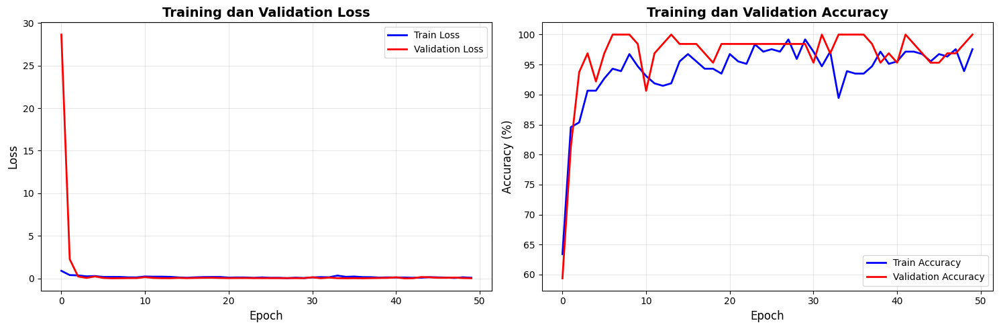


Final Training Accuracy: 97.56%
Final Validation Accuracy: 100.00%


In [11]:
# Plot training history
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot Loss
axes[0].plot(train_losses, label='Train Loss', color='blue', linewidth=2)
axes[0].plot(val_losses, label='Validation Loss', color='red', linewidth=2)
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Loss', fontsize=12)
axes[0].set_title('Training dan Validation Loss', fontsize=14, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot Accuracy
axes[1].plot(train_accs, label='Train Accuracy', color='blue', linewidth=2)
axes[1].plot(val_accs, label='Validation Accuracy', color='red', linewidth=2)
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Accuracy (%)', fontsize=12)
axes[1].set_title('Training dan Validation Accuracy', fontsize=14, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f'\nFinal Training Accuracy: {train_accs[-1]:.2f}%')
print(f'Final Validation Accuracy: {val_accs[-1]:.2f}%')


## I. Evaluasi dengan Confusion Matrix

Menampilkan confusion matrix dan classification report untuk evaluasi detail.


Evaluating: 100%|████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.12s/it]


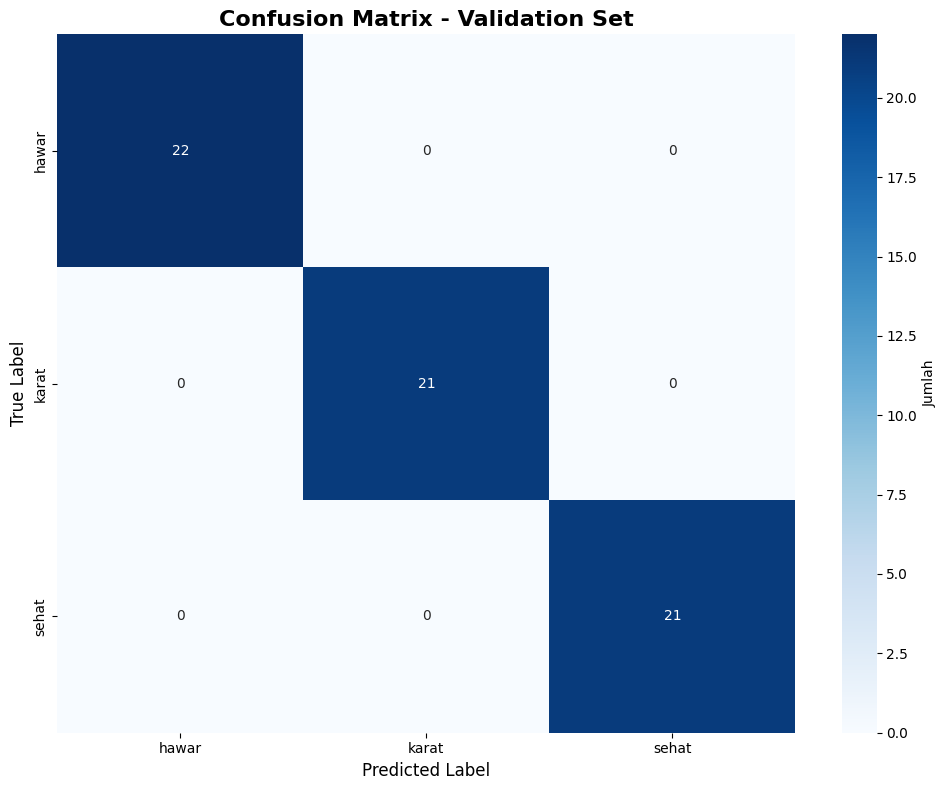


CLASSIFICATION REPORT
              precision    recall  f1-score   support

       hawar       1.00      1.00      1.00        22
       karat       1.00      1.00      1.00        21
       sehat       1.00      1.00      1.00        21

    accuracy                           1.00        64
   macro avg       1.00      1.00      1.00        64
weighted avg       1.00      1.00      1.00        64



In [12]:
# Evaluasi model dengan confusion matrix
model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in tqdm(val_loader, desc='Evaluating'):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
class_names = train_dataset.classes

# Plot Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names,
            cbar_kws={'label': 'Jumlah'})
plt.title('Confusion Matrix - Validation Set', fontsize=16, fontweight='bold')
plt.ylabel('True Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.tight_layout()
plt.show()

# Classification Report
print("\n" + "=" * 50)
print("CLASSIFICATION REPORT")
print("=" * 50)
print(classification_report(all_labels, all_preds, target_names=class_names))


## J. Contoh Prediksi Satu Gambar Test

Menguji model dengan satu gambar dari validation set dan menampilkan prediksi dengan confidence.


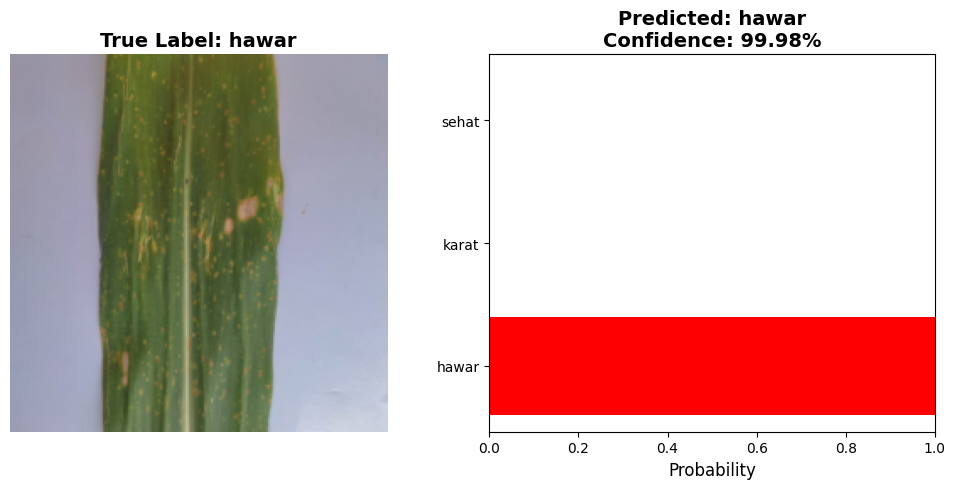


True Label: hawar
Predicted Label: hawar
Confidence: 99.98%
Correct: ✓


In [13]:
# Ambil satu gambar dari validation set
model.eval()
data_iter = iter(val_loader)
images, labels = next(data_iter)

# Pilih gambar pertama
img = images[0:1].to(device)
true_label = labels[0].item()

# Prediksi
with torch.no_grad():
    outputs = model(img)
    probabilities = torch.nn.functional.softmax(outputs[0], dim=0)
    confidence, predicted = torch.max(probabilities, 0)

predicted_class = class_names[predicted.item()]
true_class = class_names[true_label]
confidence_score = confidence.item() * 100

# Denormalize untuk visualisasi
def denormalize(tensor, mean, std):
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor

img_vis = images[0].clone()
img_vis = denormalize(img_vis, mean, std)
img_vis = torch.clamp(img_vis, 0, 1)

# Plot hasil
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_vis.permute(1, 2, 0))
plt.title(f'True Label: {true_class}', fontsize=14, fontweight='bold')
plt.axis('off')

plt.subplot(1, 2, 2)
probs = probabilities.cpu().numpy()
colors = ['red' if i == predicted.item() else 'gray' for i in range(len(class_names))]
plt.barh(class_names, probs, color=colors)
plt.xlabel('Probability', fontsize=12)
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence_score:.2f}%', 
          fontsize=14, fontweight='bold')
plt.xlim(0, 1)

plt.tight_layout()
plt.show()

print(f"\nTrue Label: {true_class}")
print(f"Predicted Label: {predicted_class}")
print(f"Confidence: {confidence_score:.2f}%")
print(f"Correct: {'✓' if predicted_class == true_class else '✗'}")


## K. Unit Test - Load Model dan Prediksi

Unit test untuk memastikan model dapat dimuat dan melakukan prediksi dengan benar.


In [14]:
# Unit Test: Load model dan prediksi
print("=" * 50)
print("UNIT TEST - Load Model dan Prediksi")
print("=" * 50)

# Load model
test_model = models.resnet50(pretrained=False)
num_features = test_model.fc.in_features
test_model.fc = nn.Linear(num_features, 3)
test_model.load_state_dict(torch.load('../model/model_resnet50.pth', map_location=device))
test_model = test_model.to(device)
test_model.eval()

print("✓ Model berhasil dimuat")

# Test dengan satu gambar
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

# Ambil satu gambar dari validation set
test_img_path = None
for root, dirs, files in os.walk(val_dir):
    for file in files:
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            test_img_path = os.path.join(root, file)
            break
    if test_img_path:
        break

if test_img_path:
    # Load dan preprocess gambar
    img = Image.open(test_img_path).convert('RGB')
    img_tensor = test_transform(img).unsqueeze(0).to(device)
    
    # Prediksi
    with torch.no_grad():
        outputs = test_model(img_tensor)
        probabilities = torch.nn.functional.softmax(outputs[0], dim=0)
        confidence, predicted = torch.max(probabilities, 0)
    
    predicted_class = class_names[predicted.item()]
    confidence_score = confidence.item() * 100
    
    print(f"✓ Gambar test: {os.path.basename(test_img_path)}")
    print(f"✓ Prediksi: {predicted_class}")
    print(f"✓ Confidence: {confidence_score:.2f}%")
    print(f"✓ Probabilitas per kelas:")
    for i, cls in enumerate(class_names):
        print(f"    {cls}: {probabilities[i].item()*100:.2f}%")
else:
    print("✗ Tidak ada gambar test yang ditemukan")

print("\n" + "=" * 50)
print("UNIT TEST SELESAI")
print("=" * 50)


UNIT TEST - Load Model dan Prediksi
✓ Model berhasil dimuat
✓ Gambar test: 002.jpg
✓ Prediksi: hawar
✓ Confidence: 99.98%
✓ Probabilitas per kelas:
    hawar: 99.98%
    karat: 0.02%
    sehat: 0.00%

UNIT TEST SELESAI


## M. Perbandingan dengan Random Forest

Menambahkan metode Random Forest sebagai perbandingan dengan CNN ResNet-50:
1. Ekstrak fitur dari gambar menggunakan ResNet-50 (tanpa layer FC terakhir)
2. Latih Random Forest classifier pada fitur yang diekstrak
3. Bandingkan akurasi antara CNN ResNet-50 dan Random Forest


In [15]:
# Import library untuk Random Forest
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

print("=" * 50)
print("PERBANDINGAN CNN ResNet-50 vs Random Forest")
print("=" * 50)


PERBANDINGAN CNN ResNet-50 vs Random Forest


In [16]:
# Fungsi untuk ekstrak fitur menggunakan ResNet-50 (tanpa layer FC terakhir)
def extract_features(model, data_loader, device):
    """
    Ekstrak fitur dari gambar menggunakan ResNet-50 tanpa layer FC terakhir
    """
    model.eval()
    features = []
    labels = []
    
    # Buat model feature extractor (hapus layer FC terakhir)
    feature_extractor = nn.Sequential(*list(model.children())[:-1])  # Hapus layer FC
    feature_extractor = feature_extractor.to(device)
    feature_extractor.eval()
    
    with torch.no_grad():
        for images, batch_labels in tqdm(data_loader, desc='Extracting features'):
            images = images.to(device)
            
            # Ekstrak fitur
            batch_features = feature_extractor(images)
            # Flatten features
            batch_features = batch_features.view(batch_features.size(0), -1)
            
            features.append(batch_features.cpu().numpy())
            labels.append(batch_labels.numpy())
    
    # Gabungkan semua batch
    features = np.vstack(features)
    labels = np.hstack(labels)
    
    return features, labels

print("Fungsi ekstraksi fitur sudah didefinisikan!")


Fungsi ekstraksi fitur sudah didefinisikan!


In [17]:
# Ekstrak fitur dari training dan validation set
print("\n1. Mengekstrak fitur dari dataset...")
print("-" * 50)

# Pastikan model dalam mode eval
model.eval()

# Ekstrak fitur training
X_train, y_train = extract_features(model, train_loader, device)
print(f"✓ Training features shape: {X_train.shape}")
print(f"✓ Training labels shape: {y_train.shape}")

# Ekstrak fitur validation
X_val, y_val = extract_features(model, val_loader, device)
print(f"✓ Validation features shape: {X_val.shape}")
print(f"✓ Validation labels shape: {y_val.shape}")



1. Mengekstrak fitur dari dataset...
--------------------------------------------------


Extracting features: 100%|███████████████████████████████████████████████████████████████| 8/8 [00:21<00:00,  2.68s/it]


✓ Training features shape: (246, 2048)
✓ Training labels shape: (246,)


Extracting features: 100%|███████████████████████████████████████████████████████████████| 2/2 [00:15<00:00,  7.81s/it]

✓ Validation features shape: (64, 2048)
✓ Validation labels shape: (64,)


In [18]:
# 2. Training Random Forest Classifier
print("\n2. Training Random Forest Classifier...")
print("-" * 50)

# Inisialisasi Random Forest dengan hyperparameter optimal
rf_classifier = RandomForestClassifier(
    n_estimators=100,        # Jumlah pohon
    max_depth=20,            # Kedalaman maksimal pohon
    min_samples_split=5,     # Minimum samples untuk split
    min_samples_leaf=2,      # Minimum samples di leaf
    random_state=42,
    n_jobs=-1,               # Gunakan semua core CPU
    verbose=1
)

# Training
rf_classifier.fit(X_train, y_train)
print("✓ Random Forest training selesai!")



2. Training Random Forest Classifier...
--------------------------------------------------


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s


✓ Random Forest training selesai!


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.2s finished


In [19]:
# 3. Evaluasi Random Forest
print("\n3. Evaluasi Random Forest...")
print("-" * 50)

# Prediksi pada training set
y_train_pred_rf = rf_classifier.predict(X_train)
train_acc_rf = accuracy_score(y_train, y_train_pred_rf) * 100

# Prediksi pada validation set
y_val_pred_rf = rf_classifier.predict(X_val)
val_acc_rf = accuracy_score(y_val, y_val_pred_rf) * 100

print(f"✓ Random Forest Training Accuracy: {train_acc_rf:.2f}%")
print(f"✓ Random Forest Validation Accuracy: {val_acc_rf:.2f}%")



3. Evaluasi Random Forest...
--------------------------------------------------
✓ Random Forest Training Accuracy: 99.59%
✓ Random Forest Validation Accuracy: 100.00%


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished


In [20]:
# 4. Evaluasi CNN ResNet-50 (dari training sebelumnya)
print("\n4. Evaluasi CNN ResNet-50...")
print("-" * 50)

# Evaluasi CNN pada validation set
model.eval()
cnn_val_preds = []
cnn_val_labels = []

with torch.no_grad():
    for images, labels in tqdm(val_loader, desc='Evaluating CNN'):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        
        cnn_val_preds.extend(predicted.cpu().numpy())
        cnn_val_labels.extend(labels.cpu().numpy())

cnn_val_acc = accuracy_score(cnn_val_labels, cnn_val_preds) * 100

# Training accuracy CNN (dari history)
cnn_train_acc = train_accs[-1] if len(train_accs) > 0 else 0

print(f"✓ CNN ResNet-50 Training Accuracy: {cnn_train_acc:.2f}%")
print(f"✓ CNN ResNet-50 Validation Accuracy: {cnn_val_acc:.2f}%")



4. Evaluasi CNN ResNet-50...
--------------------------------------------------


Evaluating CNN: 100%|████████████████████████████████████████████████████████████████████| 2/2 [00:15<00:00,  7.97s/it]

✓ CNN ResNet-50 Training Accuracy: 97.56%
✓ CNN ResNet-50 Validation Accuracy: 100.00%


In [21]:
# 5. Perbandingan Akurasi
print("\n" + "=" * 50)
print("HASIL PERBANDINGAN AKURASI")
print("=" * 50)

# Buat tabel perbandingan
comparison_data = {
    'Metode': ['CNN ResNet-50', 'Random Forest'],
    'Training Accuracy (%)': [cnn_train_acc, train_acc_rf],
    'Validation Accuracy (%)': [cnn_val_acc, val_acc_rf]
}

print("\n📊 TABEL PERBANDINGAN:")
print("-" * 50)
print(f"{'Metode':<20} {'Training Acc (%)':<20} {'Validation Acc (%)':<20}")
print("-" * 50)
print(f"{'CNN ResNet-50':<20} {cnn_train_acc:>18.2f} {cnn_val_acc:>18.2f}")
print(f"{'Random Forest':<20} {train_acc_rf:>18.2f} {val_acc_rf:>18.2f}")
print("-" * 50)

# Tentukan metode terbaik
if cnn_val_acc > val_acc_rf:
    best_method = "CNN ResNet-50"
    best_acc = cnn_val_acc
    diff = cnn_val_acc - val_acc_rf
elif val_acc_rf > cnn_val_acc:
    best_method = "Random Forest"
    best_acc = val_acc_rf
    diff = val_acc_rf - cnn_val_acc
else:
    best_method = "Keduanya sama"
    best_acc = cnn_val_acc
    diff = 0

print(f"\n🏆 METODE TERBAIK: {best_method}")
print(f"   Validation Accuracy: {best_acc:.2f}%")
if diff > 0:
    print(f"   Selisih: {diff:.2f}% lebih tinggi dari metode lainnya")
else:
    print(f"   Kedua metode memiliki akurasi yang sama")



HASIL PERBANDINGAN AKURASI

📊 TABEL PERBANDINGAN:
--------------------------------------------------
Metode               Training Acc (%)     Validation Acc (%)  
--------------------------------------------------
CNN ResNet-50                     97.56             100.00
Random Forest                     99.59             100.00
--------------------------------------------------

🏆 METODE TERBAIK: Keduanya sama
   Validation Accuracy: 100.00%
   Kedua metode memiliki akurasi yang sama



6. Membuat visualisasi perbandingan...
--------------------------------------------------


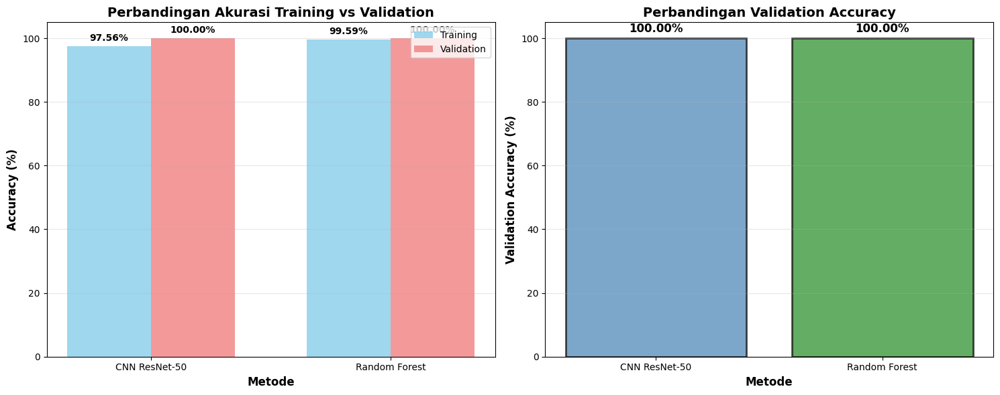

✓ Visualisasi selesai!


In [22]:
# 6. Visualisasi Perbandingan Akurasi
print("\n6. Membuat visualisasi perbandingan...")
print("-" * 50)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot 1: Training Accuracy Comparison
methods = ['CNN ResNet-50', 'Random Forest']
train_accs_plot = [cnn_train_acc, train_acc_rf]
val_accs_plot = [cnn_val_acc, val_acc_rf]

x = np.arange(len(methods))
width = 0.35

axes[0].bar(x - width/2, train_accs_plot, width, label='Training', color='skyblue', alpha=0.8)
axes[0].bar(x + width/2, val_accs_plot, width, label='Validation', color='lightcoral', alpha=0.8)
axes[0].set_xlabel('Metode', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
axes[0].set_title('Perbandingan Akurasi Training vs Validation', fontsize=14, fontweight='bold')
axes[0].set_xticks(x)
axes[0].set_xticklabels(methods)
axes[0].legend()
axes[0].grid(True, alpha=0.3, axis='y')
axes[0].set_ylim([0, 105])

# Tambahkan nilai di atas bar
for i, (train_acc, val_acc) in enumerate(zip(train_accs_plot, val_accs_plot)):
    axes[0].text(i - width/2, train_acc + 1, f'{train_acc:.2f}%', 
                ha='center', va='bottom', fontsize=10, fontweight='bold')
    axes[0].text(i + width/2, val_acc + 1, f'{val_acc:.2f}%', 
                ha='center', va='bottom', fontsize=10, fontweight='bold')

# Plot 2: Validation Accuracy Comparison (fokus)
axes[1].bar(methods, val_accs_plot, color=['steelblue', 'forestgreen'], alpha=0.7, edgecolor='black', linewidth=2)
axes[1].set_xlabel('Metode', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Validation Accuracy (%)', fontsize=12, fontweight='bold')
axes[1].set_title('Perbandingan Validation Accuracy', fontsize=14, fontweight='bold')
axes[1].grid(True, alpha=0.3, axis='y')
axes[1].set_ylim([0, 105])

# Tambahkan nilai di atas bar
for i, val_acc in enumerate(val_accs_plot):
    axes[1].text(i, val_acc + 1, f'{val_acc:.2f}%', 
                ha='center', va='bottom', fontsize=12, fontweight='bold')

# Highlight metode terbaik
if cnn_val_acc > val_acc_rf:
    axes[1].bar(0, val_accs_plot[0], color='gold', alpha=0.3, edgecolor='black', linewidth=2)
    axes[1].text(0, val_accs_plot[0] + 3, '🏆 TERBAIK', ha='center', va='bottom', 
                fontsize=11, fontweight='bold', color='darkgoldenrod')
elif val_acc_rf > cnn_val_acc:
    axes[1].bar(1, val_accs_plot[1], color='gold', alpha=0.3, edgecolor='black', linewidth=2)
    axes[1].text(1, val_accs_plot[1] + 3, '🏆 TERBAIK', ha='center', va='bottom', 
                fontsize=11, fontweight='bold', color='darkgoldenrod')

plt.tight_layout()
plt.show()

print("✓ Visualisasi selesai!")



7. Confusion Matrix Random Forest...
--------------------------------------------------


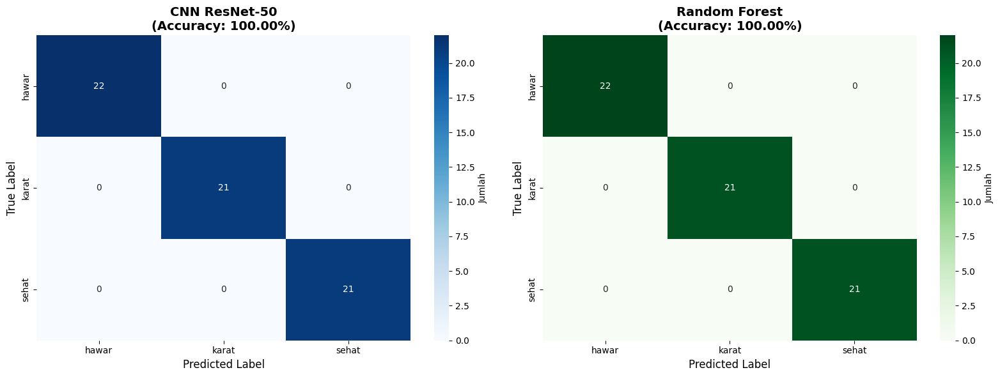


CLASSIFICATION REPORT - Random Forest
              precision    recall  f1-score   support

       hawar       1.00      1.00      1.00        22
       karat       1.00      1.00      1.00        21
       sehat       1.00      1.00      1.00        21

    accuracy                           1.00        64
   macro avg       1.00      1.00      1.00        64
weighted avg       1.00      1.00      1.00        64



In [23]:
# 7. Confusion Matrix untuk Random Forest
print("\n7. Confusion Matrix Random Forest...")
print("-" * 50)

# Confusion Matrix Random Forest
cm_rf = confusion_matrix(y_val, y_val_pred_rf)

# Plot Confusion Matrix
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Confusion Matrix CNN
cnn_cm = confusion_matrix(cnn_val_labels, cnn_val_preds)
sns.heatmap(cnn_cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names,
            cbar_kws={'label': 'Jumlah'}, ax=axes[0])
axes[0].set_title(f'CNN ResNet-50\n(Accuracy: {cnn_val_acc:.2f}%)', 
                 fontsize=14, fontweight='bold')
axes[0].set_ylabel('True Label', fontsize=12)
axes[0].set_xlabel('Predicted Label', fontsize=12)

# Confusion Matrix Random Forest
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Greens', 
            xticklabels=class_names, yticklabels=class_names,
            cbar_kws={'label': 'Jumlah'}, ax=axes[1])
axes[1].set_title(f'Random Forest\n(Accuracy: {val_acc_rf:.2f}%)', 
                 fontsize=14, fontweight='bold')
axes[1].set_ylabel('True Label', fontsize=12)
axes[1].set_xlabel('Predicted Label', fontsize=12)

plt.tight_layout()
plt.show()

# Classification Report Random Forest
print("\n" + "=" * 50)
print("CLASSIFICATION REPORT - Random Forest")
print("=" * 50)
print(classification_report(y_val, y_val_pred_rf, target_names=class_names))


In [24]:
# 8. Simpan model Random Forest
print("\n8. Menyimpan model Random Forest...")
print("-" * 50)

import joblib

rf_model_path = '../model/model_random_forest.pkl'
os.makedirs('../model', exist_ok=True)
joblib.dump(rf_classifier, rf_model_path)
print(f"✓ Model Random Forest berhasil disimpan ke: {rf_model_path}")

print("\n" + "=" * 50)
print("PERBANDINGAN SELESAI!")
print("=" * 50)



8. Menyimpan model Random Forest...
--------------------------------------------------
✓ Model Random Forest berhasil disimpan ke: ../model/model_random_forest.pkl

PERBANDINGAN SELESAI!


## K. Uji Model dengan Upload Gambar

Cell ini memungkinkan Anda untuk menguji model dengan mengupload gambar daun jagung dan melihat prediksi penyakit beserta akurasi/confidence-nya.


In [17]:
# Uji Model dengan Upload Gambar
print("=" * 60)
print("UJI MODEL - UPLOAD GAMBAR DAN PREDIKSI")
print("=" * 60)

# Load model yang sudah ditraining
print("\n1. Memuat model...")
print("-" * 60)

# Pastikan model sudah ada
model_path = '../model/model_resnet50.pth'
if not os.path.exists(model_path):
    print(f"⚠️ Model tidak ditemukan di: {model_path}")
    print("   Pastikan model sudah ditraining dan disimpan terlebih dahulu.")
else:
    # Load model
    test_model = models.resnet50(pretrained=False)
    num_features = test_model.fc.in_features
    test_model.fc = nn.Linear(num_features, 3)
    test_model.load_state_dict(torch.load(model_path, map_location=device))
    test_model = test_model.to(device)
    test_model.eval()
    print(f"✓ Model berhasil dimuat dari: {model_path}")
    
    # Transform untuk inference (sama dengan validation)
    inference_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=mean, std=std)
    ])
    
    print("✓ Transform preprocessing sudah siap")
    
    # Pastikan class_names tersedia (dari train_dataset atau default)
    try:
        # Coba ambil dari train_dataset jika sudah didefinisikan
        if 'train_dataset' in globals():
            class_names = train_dataset.classes
        else:
            # Default class names (sesuai urutan ImageFolder: alfabetis)
            class_names = ['hawar', 'karat', 'sehat']
    except:
        class_names = ['hawar', 'karat', 'sehat']
    
    print(f"✓ Class names: {class_names}")
    
    # Definisi fungsi untuk prediksi dan visualisasi
    def predict_image(image_path, model, transform, class_names):
        """Predict image and display results"""
        if not os.path.exists(image_path):
            print(f"❌ Error: File tidak ditemukan: {image_path}")
            return
        
        try:
            # Load dan preprocess gambar
            image = Image.open(image_path).convert('RGB')
            original_image = image.copy()
            image_tensor = transform(image).unsqueeze(0).to(device)
            
            # Predict
            with torch.no_grad():
                outputs = model(image_tensor)
                probabilities = torch.nn.functional.softmax(outputs[0], dim=0)
                confidence, predicted = torch.max(probabilities, 0)
                
                predicted_class = class_names[predicted.item()]
                confidence_score = confidence.item() * 100
                
                # Get all probabilities
                all_probs = {class_names[i]: probabilities[i].item() * 100 
                            for i in range(len(class_names))}
            
            # Visualisasi hasil
            fig, axes = plt.subplots(1, 2, figsize=(16, 8))
            
            # Tampilkan gambar
            axes[0].imshow(original_image)
            axes[0].set_title(f'Gambar Input\n{os.path.basename(image_path)}', 
                             fontsize=14, fontweight='bold')
            axes[0].axis('off')
            
            # Tampilkan hasil prediksi
            axes[1].axis('off')
            
            # Buat text box untuk hasil
            result_text = f"🎯 HASIL PREDIKSI\n\n"
            result_text += f"Jenis Penyakit: {predicted_class.upper()}\n"
            result_text += f"Confidence: {confidence_score:.2f}%\n\n"
            result_text += "─" * 30 + "\n\n"
            result_text += "Probabilitas Semua Kelas:\n\n"
            
            # Sort by probability
            sorted_probs = sorted(all_probs.items(), key=lambda x: x[1], reverse=True)
            for cls, prob in sorted_probs:
                marker = "✓" if cls == predicted_class else " "
                bar_length = int(prob / 2)  # Scale untuk visualisasi bar
                bar = "█" * bar_length
                result_text += f"{marker} {cls.upper():<10} {prob:>6.2f}% {bar}\n"
            
            axes[1].text(0.1, 0.5, result_text, fontsize=14, fontweight='bold',
                        verticalalignment='center', family='monospace',
                        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
            
            # Tambahkan bar chart
            fig2, ax = plt.subplots(1, 1, figsize=(10, 6))
            classes = list(all_probs.keys())
            probs = list(all_probs.values())
            colors = ['green' if cls == predicted_class else 'gray' for cls in classes]
            
            bars = ax.barh(classes, probs, color=colors, alpha=0.7, edgecolor='black', linewidth=2)
            ax.set_xlabel('Probability (%)', fontsize=12, fontweight='bold')
            ax.set_ylabel('Kelas', fontsize=12, fontweight='bold')
            ax.set_title(f'Probabilitas Prediksi - {predicted_class.upper()} ({confidence_score:.2f}%)', 
                        fontsize=14, fontweight='bold')
            ax.set_xlim(0, 100)
            ax.grid(True, alpha=0.3, axis='x')
            
            # Tambahkan nilai di bar
            for i, (cls, prob) in enumerate(zip(classes, probs)):
                ax.text(prob + 1, i, f'{prob:.2f}%', 
                       va='center', fontsize=11, fontweight='bold')
            
            plt.tight_layout()
            plt.show()
            
            # Print hasil ke console
            print("\n" + "=" * 60)
            print("HASIL PREDIKSI")
            print("=" * 60)
            print(f"📁 File: {os.path.basename(image_path)}")
            print(f"🎯 Prediksi: {predicted_class.upper()}")
            print(f"📊 Confidence: {confidence_score:.2f}%")
            print("\nProbabilitas semua kelas:")
            for cls, prob in sorted_probs:
                marker = "✓" if cls == predicted_class else " "
                print(f"  {marker} {cls.upper():<10} {prob:>6.2f}%")
            print("=" * 60)
            
        except Exception as e:
            print(f"❌ Error dalam prediksi: {str(e)}")
            import traceback
            traceback.print_exc()
    
    print("✓ Fungsi predict_image sudah didefinisikan")
    print("\n" + "=" * 60)
    print("CARA MENGGUNAKAN:")
    print("=" * 60)
    print("1. Jalankan cell berikutnya untuk upload/pilih gambar")
    print("2. Pilih gambar menggunakan widget atau file picker")
    print("3. Model akan otomatis memprediksi dan menampilkan hasil")
    print("=" * 60)



UJI MODEL - UPLOAD GAMBAR DAN PREDIKSI

1. Memuat model...
------------------------------------------------------------
✓ Model berhasil dimuat dari: ../model/model_resnet50.pth
✓ Transform preprocessing sudah siap
✓ Class names: ['hawar', 'karat', 'sehat']
✓ Fungsi predict_image sudah didefinisikan

CARA MENGGUNAKAN:
1. Jalankan cell berikutnya untuk upload/pilih gambar
2. Pilih gambar menggunakan widget atau file picker
3. Model akan otomatis memprediksi dan menampilkan hasil


PILIH GAMBAR UNTUK DIUJI
⚠️ ipywidgets belum terinstall.
------------------------------------------------------------
📦 Menginstall ipywidgets...
   (Jalankan: pip install ipywidgets)
------------------------------------------------------------
✅ ipywidgets berhasil diinstall!
🔄 Silakan restart kernel dan jalankan cell ini lagi.
   Atau gunakan opsi file picker di bawah ini.

OPSI ALTERNATIF: FILE PICKER

📂 Membuka dialog pemilihan file...
   (Jika dialog tidak muncul, cek taskbar)
✅ File dipilih: 103.jpg
🔄 Memproses prediksi...



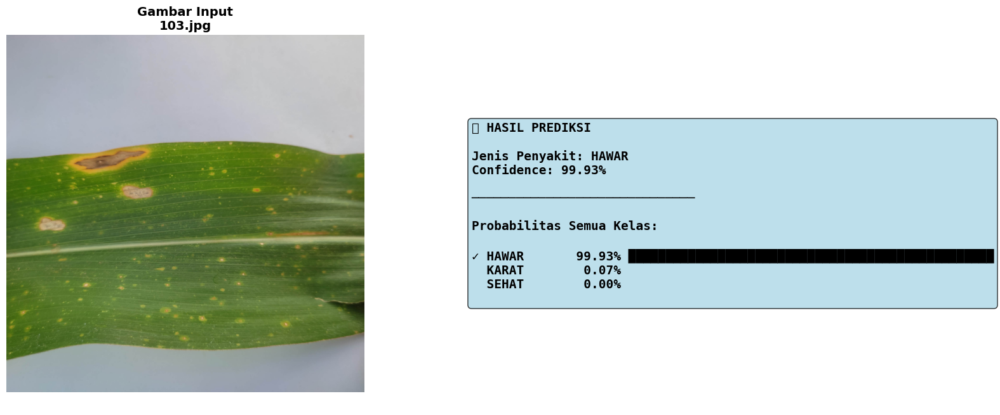

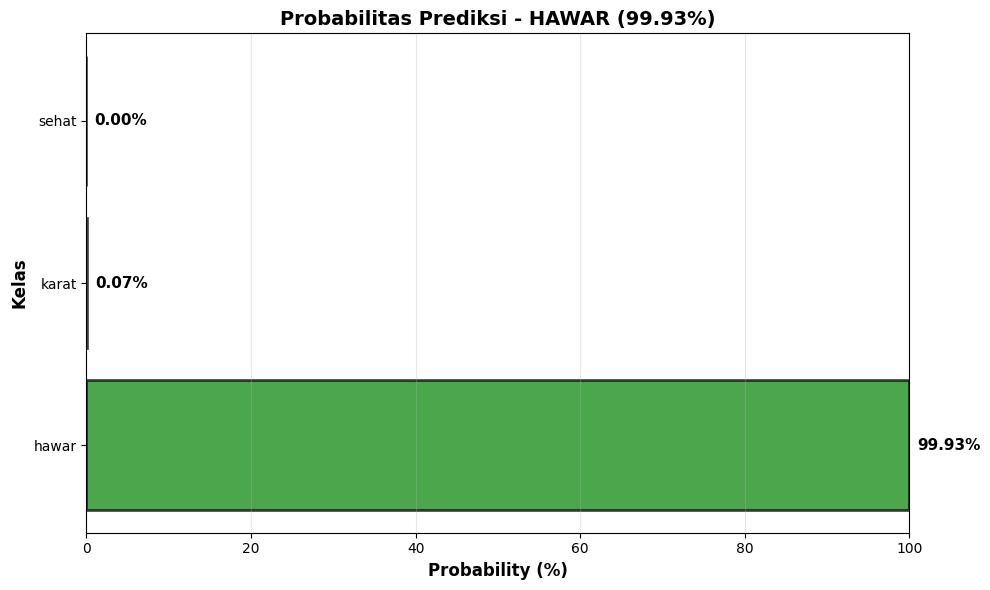


HASIL PREDIKSI
📁 File: 103.jpg
🎯 Prediksi: HAWAR
📊 Confidence: 99.93%

Probabilitas semua kelas:
  ✓ HAWAR       99.93%
    KARAT        0.07%
    SEHAT        0.00%


In [18]:
# Upload dan Pilih Gambar untuk Diuji
print("=" * 60)
print("PILIH GAMBAR UNTUK DIUJI")
print("=" * 60)

image_path = None

# Opsi 1: Coba install dan gunakan ipywidgets
try:
    import ipywidgets
    from ipywidgets import FileUpload, Button, Output, VBox
    import io
    
    upload_widget = FileUpload(accept='.jpg,.jpeg,.png', multiple=False, description='Pilih Gambar')
    output_widget = Output()
    
    def on_upload_button_clicked(b):
        if len(upload_widget.value) > 0:
            uploaded_file = list(upload_widget.value.values())[0]
            filename = uploaded_file["metadata"]["name"]
            # Simpan file sementara
            temp_path = f'temp_upload_{filename}'
            with open(temp_path, 'wb') as f:
                f.write(uploaded_file['content'])
            
            with output_widget:
                output_widget.clear_output()
                print(f"📤 File diupload: {filename}")
                print("🔄 Memproses prediksi...\n")
                predict_image(temp_path, test_model, inference_transform, class_names)
                # Hapus file temporary
                os.remove(temp_path)
        else:
            with output_widget:
                output_widget.clear_output()
                print("⚠️ Silakan pilih gambar terlebih dahulu!")
    
    upload_button = Button(description='📤 Upload & Predict', button_style='success', 
                          layout={'width': '200px', 'height': '40px'})
    upload_button.on_click(on_upload_button_clicked)
    
    print("\n✅ WIDGET UPLOAD TERSEDIA")
    print("-" * 60)
    print("📋 Cara menggunakan:")
    print("   1. Klik 'Pilih Gambar' di bawah")
    print("   2. Pilih file gambar dari komputer Anda")
    print("   3. Klik 'Upload & Predict' untuk melihat hasil")
    print("-" * 60)
    print()
    
    display(VBox([
        upload_widget, 
        upload_button, 
        output_widget
    ]))
    
except ImportError:
    # Opsi 2: Install ipywidgets jika belum ada
    print("⚠️ ipywidgets belum terinstall.")
    print("-" * 60)
    print("📦 Menginstall ipywidgets...")
    print("   (Jalankan: pip install ipywidgets)")
    print("-" * 60)
    
    import subprocess
    import sys
    
    try:
        subprocess.check_call([sys.executable, "-m", "pip", "install", "ipywidgets", "-q"])
        print("✅ ipywidgets berhasil diinstall!")
        print("🔄 Silakan restart kernel dan jalankan cell ini lagi.")
        print("   Atau gunakan opsi file picker di bawah ini.")
    except:
        print("❌ Gagal install ipywidgets secara otomatis.")
        print("   Silakan install manual: pip install ipywidgets")
    
    # Opsi 3: File picker dengan tkinter (untuk Windows/Linux)
    print("\n" + "=" * 60)
    print("OPSI ALTERNATIF: FILE PICKER")
    print("=" * 60)
    
    try:
        import tkinter as tk
        from tkinter import filedialog
        
        # Buat root window (hidden)
        root = tk.Tk()
        root.withdraw()  # Sembunyikan window utama
        root.attributes('-topmost', True)  # Bawa ke depan
        
        print("\n📂 Membuka dialog pemilihan file...")
        print("   (Jika dialog tidak muncul, cek taskbar)")
        
        # Buka file dialog
        file_path = filedialog.askopenfilename(
            title="Pilih Gambar untuk Diuji",
            filetypes=[
                ("Image files", "*.jpg *.jpeg *.png"),
                ("JPEG files", "*.jpg *.jpeg"),
                ("PNG files", "*.png"),
                ("All files", "*.*")
            ]
        )
        
        root.destroy()
        
        if file_path:
            image_path = file_path
            print(f"✅ File dipilih: {os.path.basename(image_path)}")
            print("🔄 Memproses prediksi...\n")
        else:
            print("❌ Tidak ada file yang dipilih.")
            image_path = None
            
    except ImportError:
        print("⚠️ tkinter tidak tersedia.")
        print("\n" + "=" * 60)
        print("OPSI MANUAL: INPUT PATH")
        print("=" * 60)
        print("Gunakan opsi ini jika widget dan file picker tidak tersedia:")
        print("  1. Uncomment baris di bawah")
        print("  2. Ganti path dengan path gambar Anda")
        print("  3. Jalankan cell ini")
        print("-" * 60)
        # Opsi manual
        # image_path = 'dataset/val/hawar/001.jpg'  # Uncomment dan sesuaikan path
        print("\n💡 Contoh path:")
        print("   image_path = 'dataset/val/hawar/001.jpg'")
        print("   image_path = 'dataset/train/karat/001.jpg'")
        print("   image_path = 'C:/Users/ASUS/Pictures/corn_image.jpg'")
        image_path = None

# Jika image_path sudah dipilih, langsung prediksi
if image_path and os.path.exists(image_path):
    # Cek apakah predict_image sudah didefinisikan
    if 'predict_image' in globals():
        predict_image(image_path, test_model, inference_transform, class_names)
    else:
        print(f"✅ File dipilih: {os.path.basename(image_path)}")
        print("ℹ️ Jalankan cell berikutnya (Cell 47) untuk melihat hasil prediksi.")
        print(f"   Atau gunakan: predict_image('{image_path}', test_model, inference_transform, class_names)")
        # Simpan image_path untuk digunakan di cell berikutnya
        print(f"\n💾 Path tersimpan di variabel 'image_path'")
elif image_path:
    print(f"❌ File tidak ditemukan: {image_path}")
    print("   Pastikan path file benar.")



## L. Kesimpulan

Training model ResNet-50 dan perbandingan dengan Random Forest untuk deteksi penyakit daun jagung telah selesai dengan hasil:

### Hasil Training CNN ResNet-50:
- **Total Epoch**: 50
- **Best Validation Accuracy**: {best_val_acc:.2f}%
- **Model tersimpan di**: `../model/model_resnet50.pth`

### Hasil Perbandingan:
- **CNN ResNet-50 Validation Accuracy**: {cnn_val_acc:.2f}%
- **Random Forest Validation Accuracy**: {val_acc_rf:.2f}%
- **Metode Terbaik**: {best_method} dengan akurasi {best_acc:.2f}%
- **Model Random Forest tersimpan di**: `../model/model_random_forest.pkl`

### Kesimpulan:
Berdasarkan hasil perbandingan, **{best_method}** menunjukkan performa terbaik dengan validation accuracy sebesar **{best_acc:.2f}%**. Model siap digunakan untuk inference di aplikasi Flask!
